# Libraries

In [1]:
#NLTK Library
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

#Gensim Library
import gensim
from gensim.models import CoherenceModel, Word2Vec
from gensim.corpora import Dictionary

#Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import ward, dendrogram, linkage 

#Visualization Libraries
import matplotlib.pyplot as plt
import pyLDAvis
import pyLDAvis.gensim

#Other Libraries
import numpy as np
import pandas as pd
import csv
import re
from tqdm import tqdm
import os
import unicodedata
import dill
import warnings
from contractions import CONTRACTION_MAP
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from datetime import datetime
from pprint import pprint
import json 
from string import punctuation
from collections import Counter

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

warnings.filterwarnings('ignore')
pyLDAvis.enable_notebook()
%matplotlib inline

## Load Dataset

In [3]:
#load all the news articles
os.chdir(r"Sentiment Analysis Thesis Datasets")
dataset_dir = os.getcwd()
corpus = []
chinese_corpus = []
local_corpus = []
other_corpus = []

folders = os.listdir(dataset_dir)
for folder in folders:
    if folder == "Chinese News Media":
        file_names = os.listdir(dataset_dir + '/' + folder)
        for file_name in file_names:
            with open(os.path.join(folder, file_name), encoding="utf-8", mode="r+", errors="ignore") as rf:
                data = csv.DictReader(rf)
                for content in data:
                    chinese_corpus.append(content['article_content'])
                    corpus.append(content['article_content'])
                    
                    
    elif folder == "Local News Media":
        file_names = os.listdir(dataset_dir + '/' + folder)
        for file_name in file_names:
            with open(os.path.join(folder, file_name), encoding="utf-8", mode="r+", errors="ignore") as rf:
                data = csv.DictReader(rf)
                for content in data:
                    local_corpus.append(content['article_content'])
                    corpus.append(content['article_content'])
                    
    else:
        file_names = os.listdir(dataset_dir + '/' + folder)
        for file_name in file_names:
            with open(os.path.join(folder, file_name), encoding="utf-8", mode="r+", errors="ignore") as rf:
                data = csv.DictReader(rf)
                for content in data:
                    other_corpus.append(content['article_content'])
                    corpus.append(content['article_content'])

## Data Preprocessing

In [3]:
def normalize_corpus(corpus):
    norm_corpus = []
    for doc in corpus:
        #remove accented characters
        doc = unicodedata.normalize("NFKD", doc).encode('ascii', 'ignore').decode('utf-8', 'ignore')

        #remove special characters
        pattern = re.compile(r"[^a-zA-Z\s]")
        doc = pattern.sub(" ", doc)

        #lower case the corpus
        doc = doc.lower()

        #remove extra space, new line and new tab
        doc = doc.strip()
        doc = re.sub(r"\t\n\r", "", doc)
        
        #expand contractions
        def expand_contractions(doc, contration_mapping=CONTRACTION_MAP):
            pattern = re.compile(r"({})".format('|'.join(contration_mapping.keys())), flags=re.I|re.A)
            def expand_match(contraction):
                match = contraction.group(0)
                first_char = match[0]
                expanded_match = contration_mapping.get(match) if contration_mapping.get(match) else contration_mapping.get(match)
                expanded_match = first_char + expanded_match[1:]
                return expanded_match
            expanded_text = pattern.sub(expand_match, doc)
            expanded_text = re.sub("'", '', expanded_text)
            return expanded_text

        doc = expand_contractions(doc)

        #perform tokenization
        wt = nltk.word_tokenize(doc)

        #remove stopwords
        stopword_list = stopwords.words('english')
        stopword_list.extend(['say', 'said', 'even', 'could', 'would', 'well', 'us', 'one', 'two', 'new', 'also', 'may'])

        filtered_doc = [token for token in wt if token not in stopword_list]

        #perform lemmatization
        lemma = WordNetLemmatizer()
        doc = [lemma.lemmatize(token) for token in filtered_doc]
        doc = ' '.join(doc)
        norm_corpus.append(doc)
    return norm_corpus

In [49]:
wv_data = norm_corpus[0:10]
cv = CountVectorizer(min_df=0., max_df=1.)
cv_matrix = cv.fit_transform(wv_data)
cv_matrix = cv_matrix.toarray()
vocab = cv.get_feature_names()
pd.DataFrame(cv_matrix, columns = vocab)

,academic,accelerating,access,according,accusation,achieve,achieved,achievement,actively,activity,...,xinhua,xu,yang,yanqing,year,yet,youth,zedong,zimbabwe,zone
0,0,0,0,1,0,0,1,2,0,0,...,1,0,0,0,3,1,0,0,0,0
1,0,0,0,2,1,0,1,1,0,0,...,1,0,0,0,2,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,3,0,2,0,2,0
4,4,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,1,0,0,1,0,0,1,0,...,0,0,0,0,8,0,0,1,0,0
6,0,0,0,2,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
7,0,0,1,0,0,1,1,0,0,1,...,0,0,4,0,0,0,0,0,0,0
8,0,0,0,0,0,1,1,0,0,0,...,0,0,4,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,2,0,1,0,0,0,0,0,0


In [13]:
def clean(corpus):
    sent = nltk.sent_tokenize(corpus)
    pattern = re.compile('[{}]'.format(p))
    st = [pattern.sub('', token) for token in sent]
    return st

for data in corpus:
    ne = clean(data)
    clean_data = ne
    for le in ne:
        print(sentiment_scores(le))

Overall sentiment dictionary is :  {'neg': 0.132, 'neu': 0.816, 'pos': 0.052, 'compound': -0.7184}
sentence was rated as  13.200000000000001 % Negative
sentence was rated as  81.6 % Neutral
sentence was rated as  5.2 % Positive
Sentence Overall Rated As Negative
None
Overall sentiment dictionary is :  {'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.765}
sentence was rated as  19.1 % Negative
sentence was rated as  80.9 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative
None
Overall sentiment dictionary is :  {'neg': 0.105, 'neu': 0.779, 'pos': 0.116, 'compound': -0.0772}
sentence was rated as  10.5 % Negative
sentence was rated as  77.9 % Neutral
sentence was rated as  11.600000000000001 % Positive
Sentence Overall Rated As Negative
None
Overall sentiment dictionary is :  {'neg': 0.018, 'neu': 0.86, 'pos': 0.123, 'compound': 0.8074}
sentence was rated as  1.7999999999999998 % Negative
sentence was rated as  86.0 % Neutral
sentence was rated as  1

In [4]:
norm_corpus = normalize_corpus(corpus)
norm_chinese_corpus = normalize_corpus(chinese_corpus)
norm_local_corpus = normalize_corpus(local_corpus)
norm_other_corpus = normalize_corpus(other_corpus)

In [13]:
#words frequency for BRI articles
for word in norm_other_corpus:
    word_tokens = nltk.word_tokenize(word)
    word_freq = Counter(word_tokens)
    most_freq_words = word_freq.most_common(10)

    
print(most_freq_words)

[('china', 25), ('country', 17), ('project', 13), ('infrastructure', 12), ('africa', 12), ('bri', 11), ('african', 10), ('road', 8), ('djibouti', 8), ('port', 8)]


## Exploratory Data Analysis

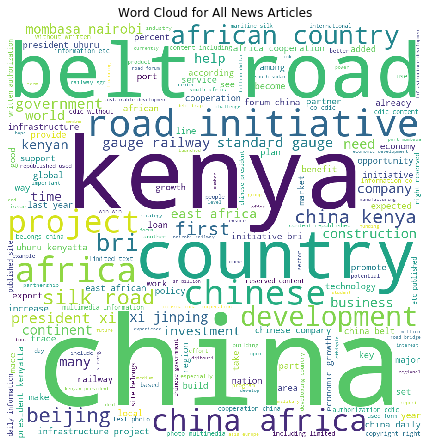

In [7]:
#word cloud for all the articles
words = ' '
STOPWORDS.add("say")
STOPWORDS.add("said")
STOPWORDS.add('also')
STOPWORDS.add('even')
STOPWORDS.add('could')
STOPWORDS.add('would')
STOPWORDS.add('well')
STOPWORDS.add('us')
STOPWORDS.add('one')
STOPWORDS.add('two')
STOPWORDS.add('new')
stopwords = set(STOPWORDS)

for word in norm_corpus:
    words = words + word + " "

article_wordcloud = WordCloud(width=900, height=900, background_color='white', stopwords=stopwords, min_font_size=10).generate(words)

plt.figure(figsize=(6,6), facecolor=None)
plt.imshow(article_wordcloud)
plt.title("Word Cloud for All News Articles")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

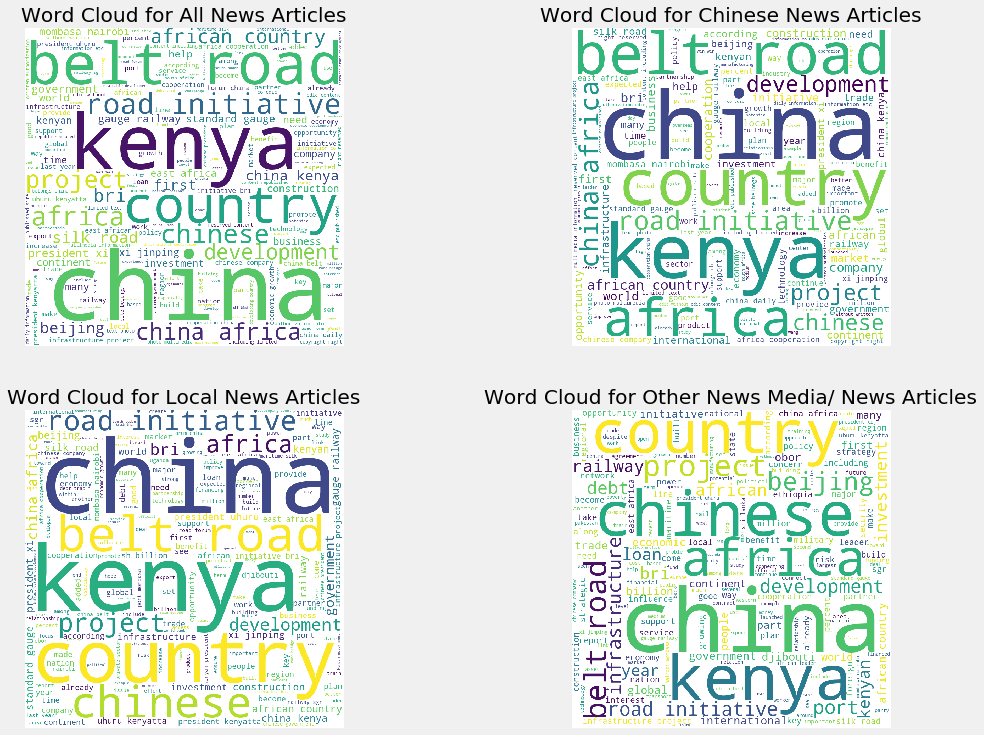

In [17]:
figure_obj = plt.figure(figsize=(16, 12))
ax1 = figure_obj.add_subplot(2,2,1)
plt.imshow(article_wordcloud)
plt.axis('off')
plt.title('Word Cloud for All News Articles')
ax2 = figure_obj.add_subplot(2,2,2)
plt.imshow(chinese_wordcloud)
plt.axis('off')
plt.title('Word Cloud for Chinese News Articles')
ax3 = figure_obj.add_subplot(2,2,3)
plt.imshow(local_wordcloud)
plt.axis('off')
plt.title('Word Cloud for Local News Articles')
ax4 = figure_obj.add_subplot(2,2,4)
plt.imshow(other_wordcloud)
plt.axis('off')
plt.title('Word Cloud for Other News Media/ News Articles')
plt.savefig('Articles Word Cloud.png')

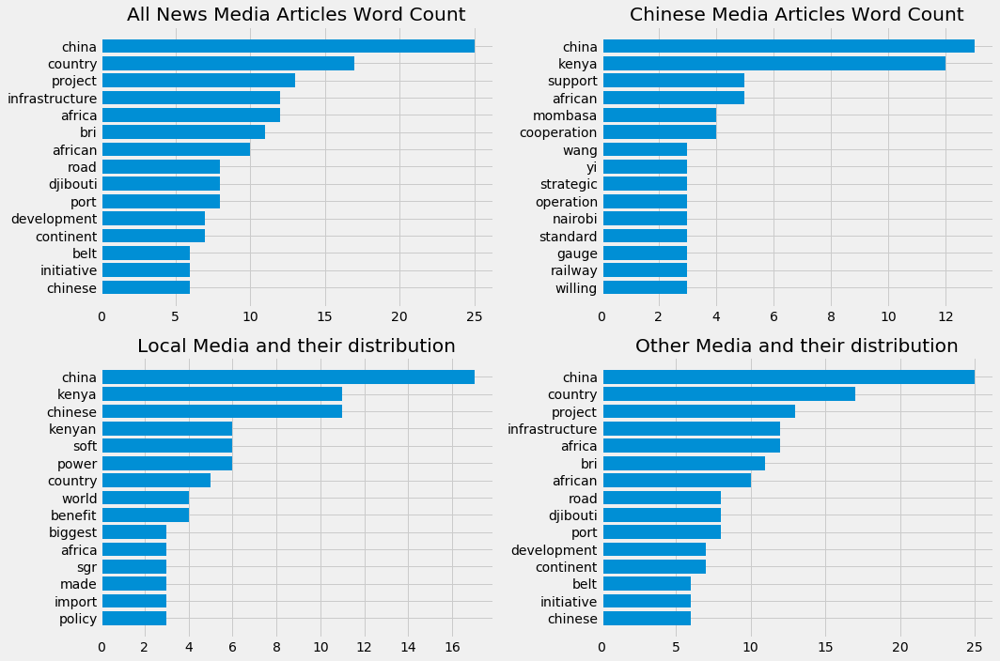

<Figure size 432x288 with 0 Axes>

In [8]:
#words frequency for BRI articles
for word in norm_corpus:
    word_tokens = nltk.word_tokenize(word)
    word_freq = Counter(word_tokens)
    most_freq_words = word_freq.most_common(15)
words = []
frequency = []

for chinese_word in norm_chinese_corpus:
    chinese_word_tokens = nltk.word_tokenize(chinese_word)
    chinese_word_freq = Counter(chinese_word_tokens)
    chinese_most_freq_words = chinese_word_freq.most_common(15)
chinese_frequency = []
chinese_words = []   

for local_word in norm_local_corpus:
    local_word_tokens = nltk.word_tokenize(local_word)
    local_word_freq = Counter(local_word_tokens)
    local_most_freq_words = local_word_freq.most_common(15)
local_frequency = []
local_words = []   

for other_word in norm_other_corpus:
    other_word_tokens = nltk.word_tokenize(other_word)
    other_word_freq = Counter(other_word_tokens)
    other_most_freq_words = other_word_freq.most_common(15)
other_frequency = []
other_words = []   

for items in most_freq_words:
    words.append(items[0])
    frequency.append(items[1])

for items in chinese_most_freq_words:
    chinese_words.append(items[0])
    chinese_frequency.append(items[1])

for items in local_most_freq_words:
    local_words.append(items[0])
    local_frequency.append(items[1])

for items in other_most_freq_words:
    other_words.append(items[0])
    other_frequency.append(items[1])


words.reverse()
frequency.reverse()

chinese_words.reverse()
chinese_frequency.reverse()

local_words.reverse()
local_frequency.reverse()

other_words.reverse()
other_frequency.reverse()

#plot word frequency
plt.style.use("fivethirtyeight")


figure_obj = plt.figure(figsize=(15, 10))
ax1 = figure_obj.add_subplot(2,2,1)
ax1.barh(words, frequency)
plt.title('All News Media Articles Word Count')


ax2 = figure_obj.add_subplot(2,2,2)
ax2.barh(chinese_words, chinese_frequency)
plt.title('Chinese Media Articles Word Count')


ax3 = figure_obj.add_subplot(2,2,3)
ax3.barh(local_words, local_frequency)
plt.title('Local Media and their distribution')

ax3 = figure_obj.add_subplot(2,2,4)
ax3.barh(other_words, other_frequency)
plt.title('Other Media and their distribution')


plt.tight_layout()
plt.show()
plt.savefig('Word Count.png')

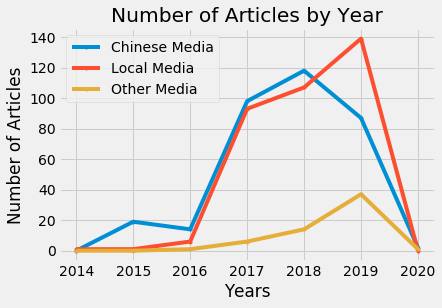

<Figure size 576x432 with 0 Axes>

In [9]:
#plot the articles by year

plt.style.use("fivethirtyeight")

years = [2014, 2015, 2016, 2017, 2018, 2019, 2020]

chinese_media = [0, 19, 14, 98, 118, 87, 2]
local_media = [1, 1, 6, 93, 107, 139, 0]
other_media = [0, 0, 1, 6, 14, 37, 1]

plt.plot(years, chinese_media, linestyle="solid", label="Chinese Media", marker=".")
plt.plot(years, local_media, linestyle="solid", label="Local Media", marker=".")
plt.plot(years, other_media, linestyle="solid", label="Other Media", marker=".")
plt.title("Number of Articles by Year")
plt.legend()
plt.xlabel("Years")
plt.ylabel("Number of Articles")
plt.figure(figsize=(8,6))
plt.tight_layout()
plt.show()

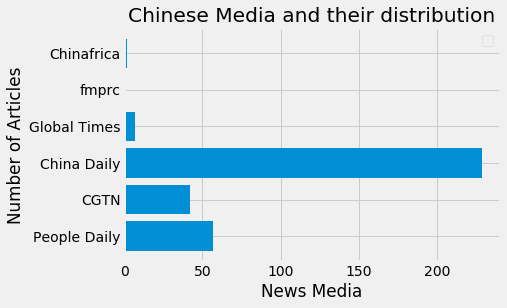

<Figure size 576x432 with 0 Axes>

In [10]:
#plot the articles by year

plt.style.use("fivethirtyeight")

chinese_media = ['People Daily', 'CGTN', 'China Daily', 'Global Times', 'fmprc', 'Chinafrica']

numbers = [57, 42, 229, 7, 1, 2]

plt.barh(chinese_media, numbers)

plt.title("Chinese Media and their distribution")
plt.legend()
plt.xlabel("News Media")
plt.ylabel("Number of Articles")
plt.figure(figsize=(8,6))
plt.tight_layout()
plt.show()

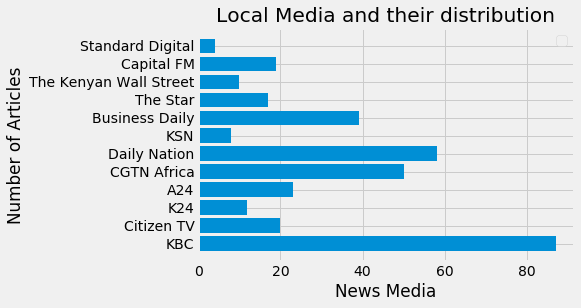

<Figure size 576x432 with 0 Axes>

In [11]:
#plot the articles by year

plt.style.use("fivethirtyeight")

local_media = ['KBC', 'Citizen TV', 'K24', 'A24', 'CGTN Africa', 'Daily Nation', 'KSN', 'Business Daily', 'The Star', 'The Kenyan Wall Street', 'Capital FM', 'Standard Digital']

numbers = [87, 20, 12, 23, 50, 58, 8, 39, 17, 10, 19, 4]

plt.barh(local_media, numbers)

plt.title("Local Media and their distribution")
plt.legend()
plt.xlabel("News Media")
plt.ylabel("Number of Articles")
plt.figure(figsize=(8,6))
plt.tight_layout()
plt.show()

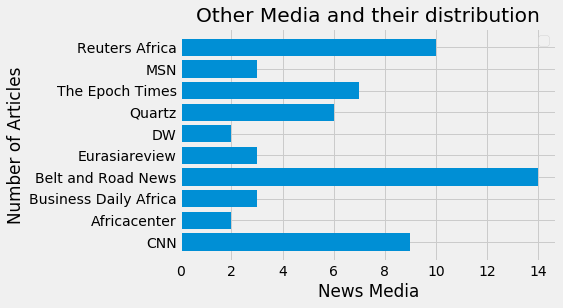

<Figure size 576x432 with 0 Axes>

In [12]:
#plot the articles by year

plt.style.use("fivethirtyeight")

other_media = ['CNN', 'Africacenter', 'Business Daily Africa', 'Belt and Road News', 'Eurasiareview', 'DW', 'Quartz', 'The Epoch Times', 'MSN', 'Reuters Africa']

numbers = [9, 2, 3, 14, 3, 2, 6, 7, 3, 10]

plt.barh(other_media, numbers)

plt.title("Other Media and their distribution")
plt.legend()
plt.xlabel("News Media")
plt.ylabel("Number of Articles")
plt.figure(figsize=(8,6))
plt.tight_layout()
plt.show()

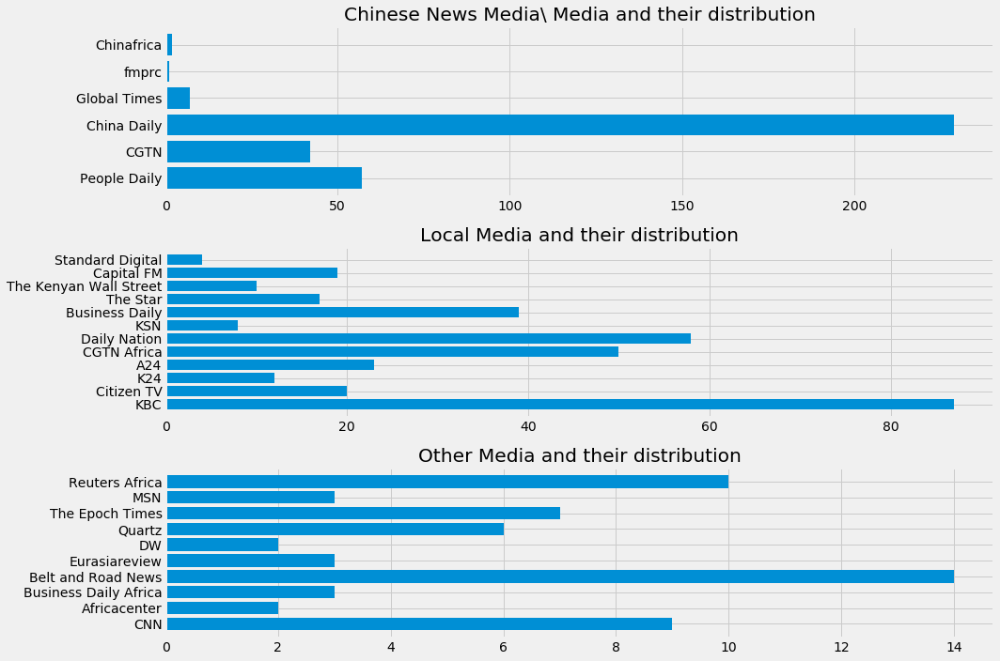

In [13]:
chinese_media = ['People Daily', 'CGTN', 'China Daily', 'Global Times', 'fmprc', 'Chinafrica']
numbers = [57, 42, 229, 7, 1, 2]

local_media = ['KBC', 'Citizen TV', 'K24', 'A24', 'CGTN Africa', 'Daily Nation', 'KSN', 'Business Daily', 'The Star', 'The Kenyan Wall Street', 'Capital FM', 'Standard Digital']
local_numbers = [87, 20, 12, 23, 50, 58, 8, 39, 17, 10, 19, 4]

other_media = ['CNN', 'Africacenter', 'Business Daily Africa', 'Belt and Road News', 'Eurasiareview', 'DW', 'Quartz', 'The Epoch Times', 'MSN', 'Reuters Africa']
other_numbers = [9, 2, 3, 14, 3, 2, 6, 7, 3, 10]

figure_obj = plt.figure(figsize=(15, 10))
ax1 = figure_obj.add_subplot(3,1,1)
ax1.barh(chinese_media, numbers)
plt.title('Chinese News Media\ Media and their distribution')


ax2 = figure_obj.add_subplot(3,1,2)
ax2.barh(local_media, local_numbers)
plt.title('Local Media and their distribution')


ax3 = figure_obj.add_subplot(3,1,3)
ax3.barh(other_media, other_numbers)
plt.title('Other Media and their distribution')



plt.tight_layout()
plt.show()

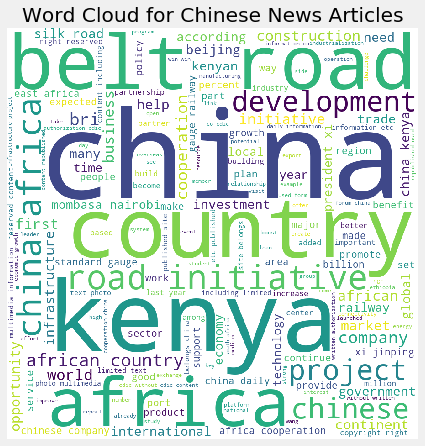

In [14]:
#Word Cloud for Chinese News Articles
words = ' '
STOPWORDS.add("say")
STOPWORDS.add("said")
stopwords = set(STOPWORDS)

for word in norm_chinese_corpus:
    words = words + word + " "

chinese_wordcloud = WordCloud(width=900, height=900, background_color='white', stopwords=stopwords, min_font_size=10).generate(words)

plt.figure(figsize=(6,6), facecolor=None)
plt.imshow(chinese_wordcloud)
plt.title("Word Cloud for Chinese News Articles")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

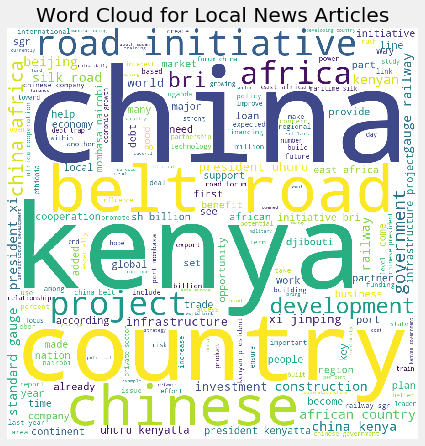

In [15]:
#Word Cloud for Local News Articles
words = ' '
STOPWORDS.add("say")
STOPWORDS.add("said")
stopwords = set(STOPWORDS)

for word in norm_local_corpus:
    words = words + word + " "

local_wordcloud = WordCloud(width=900, height=900, background_color='white', stopwords=stopwords, min_font_size=10).generate(words)

plt.figure(figsize=(6,6), facecolor=None)
plt.imshow(local_wordcloud)
plt.title("Word Cloud for Local News Articles")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

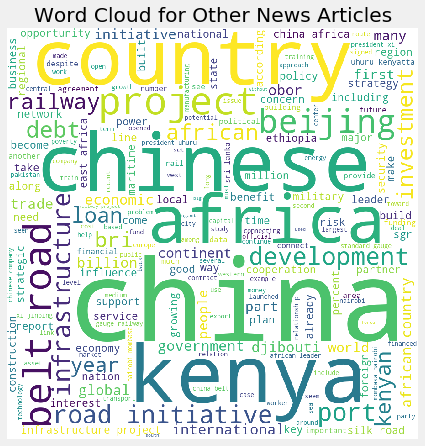

In [16]:
#Word Cloud for Other News Articles
words = ' '
STOPWORDS.add("say")
STOPWORDS.add("said")
stopwords = set(STOPWORDS)

for word in norm_other_corpus:
    words = words + word + " "

other_wordcloud = WordCloud(width=900, height=900, background_color='white', stopwords=stopwords, min_font_size=10).generate(words)

plt.figure(figsize=(6,6), facecolor=None)
plt.imshow(other_wordcloud)
plt.title("Word Cloud for Other News Articles")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# Chapter 4

## Topic Modeling for All News Articles

In [18]:
#corpus bigram for all the news articles
tokenize_corpus = [nltk.word_tokenize(token) for token in norm_corpus]
bigram = gensim.models.Phrases(tokenize_corpus, min_count=20, threshold=20, delimiter=b'_')

bigram_model = gensim.models.phrases.Phraser(bigram)

norm_corpus_bigram = [bigram_model[token] for token in tokenize_corpus]

In [19]:
#build dictionary for the corpus
dictionary = Dictionary(norm_corpus_bigram)
print((list(dictionary.items())))

[(0, 'according'), (1, 'achieved'), (2, 'achievement'), (3, 'addressing'), (4, 'adopted'), (5, 'african'), (6, 'agenda'), (7, 'alone'), (8, 'annual'), (9, 'area'), (10, 'back'), (11, 'bear'), (12, 'begun'), (13, 'beijing'), (14, 'belief'), (15, 'belt_road'), (16, 'benefit'), (17, 'bigger'), (18, 'billion'), (19, 'blazing'), (20, 'boosted'), (21, 'bri'), (22, 'building'), (23, 'built'), (24, 'cambodia'), (25, 'caput'), (26, 'centered'), (27, 'champion'), (28, 'china'), (29, 'chinese'), (30, 'clue'), (31, 'come'), (32, 'continued'), (33, 'contribution'), (34, 'cooperation'), (35, 'cost'), (36, 'country'), (37, 'created'), (38, 'data'), (39, 'day'), (40, 'deadline'), (41, 'decade'), (42, 'demonstration'), (43, 'design'), (44, 'developing'), (45, 'development'), (46, 'different'), (47, 'disabled'), (48, 'doubled'), (49, 'draw'), (50, 'drive'), (51, 'earlier'), (52, 'education'), (53, 'efficient'), (54, 'effort'), (55, 'elderly'), (56, 'elimination'), (57, 'empowerment'), (58, 'encouragemen

In [20]:
# Filter out words that occur less than 20 documents, or more than 50% of the documents.
dictionary.filter_extremes(no_below=20, no_above=0.6)

print('Total Vocabulary Size:', len(dictionary))

Total Vocabulary Size: 2061


In [21]:
print((list(dictionary.items())))

[(0, 'according'), (1, 'achieved'), (2, 'achievement'), (3, 'addressing'), (4, 'adopted'), (5, 'agenda'), (6, 'alone'), (7, 'annual'), (8, 'area'), (9, 'back'), (10, 'begun'), (11, 'beijing'), (12, 'belief'), (13, 'benefit'), (14, 'bigger'), (15, 'billion'), (16, 'boosted'), (17, 'bri'), (18, 'building'), (19, 'built'), (20, 'come'), (21, 'continued'), (22, 'contribution'), (23, 'cooperation'), (24, 'cost'), (25, 'created'), (26, 'data'), (27, 'day'), (28, 'decade'), (29, 'demonstration'), (30, 'design'), (31, 'developing'), (32, 'different'), (33, 'draw'), (34, 'drive'), (35, 'earlier'), (36, 'education'), (37, 'efficient'), (38, 'effort'), (39, 'end'), (40, 'enterprise'), (41, 'ever'), (42, 'example'), (43, 'experience'), (44, 'facing'), (45, 'fall'), (46, 'far'), (47, 'find'), (48, 'first'), (49, 'five'), (50, 'focused'), (51, 'food'), (52, 'food_security'), (53, 'forum'), (54, 'forward'), (55, 'founding'), (56, 'framework'), (57, 'fruit'), (58, 'fund'), (59, 'global'), (60, 'goal')

In [22]:
# Transforming corpus into bag of words vectors
bow_corpus = [dictionary.doc2bow(doc) for doc in norm_corpus_bigram]
print(bow_corpus[1][:50])

[(0, 2), (1, 1), (2, 1), (8, 1), (11, 2), (13, 1), (18, 1), (23, 6), (32, 1), (38, 1), (40, 1), (53, 1), (55, 1), (72, 3), (74, 1), (85, 1), (89, 2), (91, 1), (97, 1), (112, 2), (119, 1), (128, 1), (132, 3), (137, 1), (139, 1), (147, 1), (154, 1), (161, 1), (169, 1), (179, 1), (180, 1), (182, 1), (183, 2), (184, 1), (185, 1), (186, 1), (187, 1), (188, 1), (189, 1), (190, 1), (191, 2), (192, 1), (193, 1), (194, 2), (195, 2), (196, 1), (197, 1), (198, 1), (199, 1), (200, 1)]


In [23]:
# viewing actual terms and their counts
print([(dictionary[idx] , freq) for idx, freq in bow_corpus[3][:50]])

[('according', 1), ('addressing', 1), ('area', 1), ('beijing', 1), ('belief', 1), ('contribution', 1), ('cooperation', 5), ('created', 1), ('different', 1), ('education', 1), ('effort', 2), ('first', 3), ('forum', 3), ('key', 1), ('many', 1), ('official', 1), ('part', 1), ('people', 8), ('percent', 1), ('played', 1), ('promoting', 1), ('republic', 1), ('role', 1), ('since', 2), ('talk', 1), ('training', 1), ('world', 1), ('year', 2), ('april', 1), ('kenyan', 1), ('occasion', 1), ('president', 1), ('promote', 1), ('public', 1), ('region', 1), ('relation', 3), ('second', 1), ('work', 2), ('agreement', 2), ('aim', 1), ('among', 1), ('company', 1), ('held', 1), ('long', 1), ('signed', 1), ('allow', 1), ('along', 1), ('art', 8), ('aspect', 1), ('authorization_cdic', 1)]


In [24]:
# total papers in the corpus
print('Total number of papers:', len(bow_corpus))

Total number of papers: 814


In [25]:
#Topic Model
lda_model = gensim.models.LdaModel(corpus=bow_corpus, id2word=dictionary,num_topics=10, chunksize=1740, alpha='auto', 
                                   eta='auto', random_state=42, iterations=500, passes=20, eval_every=None)

In [26]:
#viewing the topics

for topic_id, topic in lda_model.print_topics(num_topics=10, num_words=10):
    pprint('Topic #'+str(topic_id+1)+':')
    pprint(topic)
    print()

'Topic #1:'
('0.012*"investment" + 0.012*"cooperation" + 0.009*"economy" + 0.007*"global" '
 '+ 0.007*"year" + 0.006*"partner" + 0.006*"percent" + 0.006*"growth" + '
 '0.006*"world" + 0.006*"opportunity"')

'Topic #2:'
('0.021*"bank" + 0.015*"market" + 0.013*"business" + 0.012*"bri" + '
 '0.010*"service" + 0.010*"street" + 0.010*"local" + 0.010*"form" + '
 '0.009*"site_belongs" + 0.009*"copyright_right"')

'Topic #3:'
('0.020*"cooperation" + 0.016*"bri" + 0.011*"world" + 0.010*"global" + '
 '0.010*"construction" + 0.009*"international" + 0.007*"company" + '
 '0.006*"economy" + 0.005*"year" + 0.005*"investment"')

'Topic #4:'
('0.016*"port" + 0.009*"bri" + 0.009*"investment" + 0.008*"djibouti" + '
 '0.008*"billion" + 0.007*"road" + 0.006*"beijing" + 0.006*"debt" + '
 '0.006*"ethiopia" + 0.006*"continent"')

'Topic #5:'
('0.011*"investment" + 0.010*"say" + 0.010*"kenyan" + 0.009*"government" + '
 '0.009*"company" + 0.008*"nairobi" + 0.008*"mombasa" + 0.007*"billion" + '
 '0.006*"service"

In [27]:
#overall mean coherence score
topic_coherences = lda_model.top_topics(bow_corpus, topn=10)
avg_coherence_score = np.mean([item[1] for item in topic_coherences])
print('Avg. Coherence Score:', avg_coherence_score)

Avg. Coherence Score: -0.9250880617311088


In [28]:
topics_with_wts = [item[0] for item in topic_coherences]
print('LDA Topics with Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    pprint('Topic #'+str(idx+1)+':')
    pprint([(term, round(wt, 3)) for wt, term in topic])
    print()

LDA Topics with Weights
'Topic #1:'
[('cooperation', 0.02),
 ('bri', 0.016),
 ('world', 0.011),
 ('global', 0.01),
 ('construction', 0.01),
 ('international', 0.009),
 ('company', 0.007),
 ('economy', 0.006),
 ('year', 0.005),
 ('investment', 0.005)]

'Topic #2:'
[('say', 0.014),
 ('bri', 0.012),
 ('world', 0.009),
 ('international', 0.008),
 ('year', 0.008),
 ('people', 0.007),
 ('percent', 0.007),
 ('many', 0.006),
 ('company', 0.005),
 ('cooperation', 0.005)]

'Topic #3:'
[('investment', 0.012),
 ('cooperation', 0.012),
 ('economy', 0.009),
 ('global', 0.007),
 ('year', 0.007),
 ('partner', 0.006),
 ('percent', 0.006),
 ('growth', 0.006),
 ('world', 0.006),
 ('opportunity', 0.006)]

'Topic #4:'
[('sgr', 0.019),
 ('company', 0.014),
 ('nairobi', 0.014),
 ('construction', 0.013),
 ('road', 0.013),
 ('kenyan', 0.012),
 ('train', 0.012),
 ('say', 0.011),
 ('year', 0.009),
 ('mombasa', 0.009)]

'Topic #5:'
[('investment', 0.011),
 ('say', 0.01),
 ('kenyan', 0.01),
 ('government', 0.009),

In [29]:
print('LDA Topics without Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([term for wt, term in topic])
    print()

LDA Topics without Weights
Topic #1:
['cooperation', 'bri', 'world', 'global', 'construction', 'international', 'company', 'economy', 'year', 'investment']

Topic #2:
['say', 'bri', 'world', 'international', 'year', 'people', 'percent', 'many', 'company', 'cooperation']

Topic #3:
['investment', 'cooperation', 'economy', 'global', 'year', 'partner', 'percent', 'growth', 'world', 'opportunity']

Topic #4:
['sgr', 'company', 'nairobi', 'construction', 'road', 'kenyan', 'train', 'say', 'year', 'mombasa']

Topic #5:
['investment', 'say', 'kenyan', 'government', 'company', 'nairobi', 'mombasa', 'billion', 'service', 'take']

Topic #6:
['port', 'bri', 'investment', 'djibouti', 'billion', 'road', 'beijing', 'debt', 'ethiopia', 'continent']

Topic #7:
['government', 'kenyan', 'president', 'investment', 'market', 'forum', 'president_kenyatta', 'business', 'cooperation', 'sector']

Topic #8:
['loan', 'debt', 'kenyan', 'government', 'beijing', 'port', 'bri', 'sgr', 'asset', 'contract']

Topic #9:

In [30]:
cv_coherence_lda_model = CoherenceModel(model=lda_model, texts=norm_corpus_bigram, corpus=bow_corpus, dictionary=dictionary, 
                                        topn=10)
avg_coherence_cv = cv_coherence_lda_model.get_coherence()

print('Avg. Coherence Score (Cv):', avg_coherence_cv)

Avg. Coherence Score (Cv): 0.4350068218547191


In [31]:
#LDA model with MALLET
os.environ.update({'MALLET_HOME':r'C:\Users\Gilbert\Desktop\mallet-2.0.8'})
MALLET_PATH = r"C:\Users\Gilbert\Desktop\mallet-2.0.8\bin\mallet"
lda_mallet = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=bow_corpus, num_topics=10, id2word=dictionary,
                                             iterations=500, workers=16)

In [32]:
topics = [[(term, round(wt, 3))
for term, wt in lda_mallet.show_topic(n, topn=10)]
for n in range(0, 10)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['university', 'cooperation', 'people', 'exchange', 'student', 'wang', 'center', 'relation', 'study', 'future']

Topic #2:
['company', 'market', 'business', 'opportunity', 'product', 'local', 'service', 'enterprise', 'investment', 'construction']

Topic #3:
['bri', 'world', 'cooperation', 'global', 'international', 'forum', 'economy', 'silk_road', 'western', 'developing']

Topic #4:
['kenyan', 'people', 'work', 'good', 'time', 'made', 'local', 'year', 'long', 'benefit']

Topic #5:
['cooperation', 'president', 'partnership', 'summit', 'forum', 'kenyan', 'kenyatta', 'president_xi', 'president_kenyatta', 'people']

Topic #6:
['sgr', 'nairobi', 'mombasa', 'line', 'road', 'construction', 'train', 'city', 'standard_gauge', 'government']

Topic #7:
['percent', 'year', 'economy', 'billion', 'million', 'region', 'growth', 'number', 'international', 'poverty']

Topic #8:
['debt', 'loan', 'government', 'beijing', 'billion', 'port', 'power', 'concern', 'nation', 'state']

Topic #9:
['glo

In [33]:
#evaluate the model

cv_coherence_model_lda_mallet = CoherenceModel(model=lda_mallet, texts=norm_corpus_bigram, corpus=bow_corpus, 
                                              dictionary=dictionary, topn=10)

In [34]:
avg_coherence_cv = cv_coherence_model_lda_mallet.get_coherence()
print('Avg. Coherence Score (Cv):', avg_coherence_cv)

Avg. Coherence Score (Cv): 0.4868361055630154


### LDA Tuning: Finding the Optimal Number of Topics

In [35]:
def topic_model_coherence_generator(corpus, texts, dictionary, start_topic_count=2, end_topic_count=10, step=1, cpus=1):
    models = []
    coherence_scores = []
    for topic_num in tqdm(range(start_topic_count, end_topic_count+1, step)):
        lda_mallet_model = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=corpus, num_topics=topic_num,
                                                            id2word=dictionary)
        cv_coherence_mallet = CoherenceModel(model=lda_mallet_model, texts=texts, corpus=corpus, dictionary=dictionary, topn=10)
        
        coherence_score = cv_coherence_mallet.get_coherence()
        coherence_scores.append(coherence_score)
        models.append(lda_mallet_model)
    return models, coherence_scores

In [36]:
lda_models, coherence_scores = topic_model_coherence_generator(bow_corpus, norm_corpus_bigram, dictionary, start_topic_count=2,
                                                                end_topic_count=30)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [23:28<00:00, 48.55s/it]


In [37]:
coherence_df = pd.DataFrame({'Number of Topics': range(2,31,1), 'Coherence Scores': np.round(coherence_scores, 4)})

coherence_df.sort_values(['Coherence Scores'], ascending=False).head(10)

,Number of Topics,Coherence Scores
13,15,0.5551
19,21,0.5513
15,17,0.5482
9,11,0.5437
26,28,0.5431
20,22,0.5405
6,8,0.5393
18,20,0.5384
28,30,0.5376
22,24,0.5371


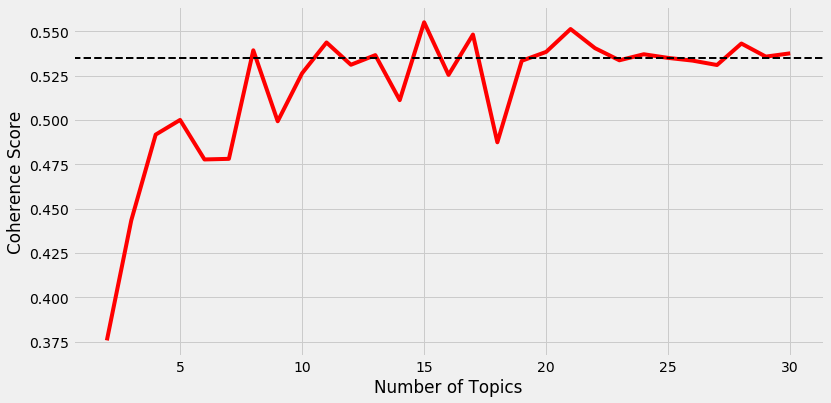

In [38]:
plt.style.use('fivethirtyeight')
x_ax = range(2, 31, 1)
y_ax = coherence_scores
plt.figure(figsize=(12, 6))
plt.plot(x_ax, y_ax, c='r')
plt.axhline(y=0.535, c='k', linestyle='--', linewidth=2)
plt.rcParams['figure.facecolor'] = 'white'
xl = plt.xlabel('Number of Topics')
yl = plt.ylabel('Coherence Score')

In [39]:
best_model_idx = coherence_df[coherence_df["Number of Topics"] == 10].index[0]
best_lda_model = lda_models[best_model_idx]
best_lda_model.num_topics

10

In [40]:
topics = [[(term, round(wt, 3))
for term, wt in best_lda_model.show_topic(n, topn=10)]
for n in range(0, best_lda_model.num_topics)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['university', 'kenyan', 'people', 'form', 'work', 'student', 'training', 'school', 'education', 'skill']

Topic #2:
['cooperation', 'forum', 'president_xi', 'kenyan', 'beijing', 'kenyatta', 'president', 'jinping', 'leader', 'bilateral']

Topic #3:
['bri', 'world', 'global', 'economy', 'international', 'nation', 'developing', 'western', 'poverty', 'connectivity']

Topic #4:
['investment', 'government', 'market', 'opportunity', 'business', 'sector', 'growth', 'investor', 'technology', 'energy']

Topic #5:
['sgr', 'nairobi', 'mombasa', 'road', 'line', 'kenyan', 'train', 'city', 'standard_gauge', 'mombasa_nairobi']

Topic #6:
['port', 'continent', 'ethiopia', 'djibouti', 'east', 'road', 'route', 'network', 'zone', 'obor']

Topic #7:
['cooperation', 'people', 'relation', 'agenda', 'international', 'important', 'relationship', 'build', 'support', 'building']

Topic #8:
['loan', 'debt', 'billion', 'beijing', 'government', 'port', 'year', 'concern', 'financing', 'power']

Topic #9:


In [41]:
topics_df = pd.DataFrame([[term for term, wt in topic] for topic in topics], columns = ['Term'+str(i) for i in range(1, 11)],
                            index=['Topic '+str(t) for t in range(1, best_lda_model.num_topics+1)]).T
topics_df

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
Term1,university,cooperation,bri,investment,sgr,port,cooperation,loan,kenyan,company
Term2,kenyan,forum,world,government,nairobi,continent,people,debt,government,year
Term3,people,president_xi,global,market,mombasa,ethiopia,relation,billion,beijing,construction
Term4,form,kenyan,economy,opportunity,road,djibouti,agenda,beijing,security,percent
Term5,work,beijing,international,business,line,east,international,government,state,local
Term6,student,kenyatta,nation,sector,kenyan,road,important,port,foreign,market
Term7,training,president,developing,growth,train,route,relationship,year,leader,business
Term8,school,jinping,western,investor,city,network,build,concern,medium,product
Term9,education,leader,poverty,technology,standard_gauge,zone,support,financing,political,million
Term10,skill,bilateral,connectivity,energy,mombasa_nairobi,obor,building,power,national,international


In [42]:
pd.set_option('display.max_colwidth', -1) 
topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], 
                         index=['Topic ' + str(t) for t in range(1, best_lda_model.num_topics+1)])
topics_df

,Terms per Topic
Topic 1,"university, kenyan, people, form, work, student, training, school, education, skill"
Topic 2,"cooperation, forum, president_xi, kenyan, beijing, kenyatta, president, jinping, leader, bilateral"
Topic 3,"bri, world, global, economy, international, nation, developing, western, poverty, connectivity"
Topic 4,"investment, government, market, opportunity, business, sector, growth, investor, technology, energy"
Topic 5,"sgr, nairobi, mombasa, road, line, kenyan, train, city, standard_gauge, mombasa_nairobi"
Topic 6,"port, continent, ethiopia, djibouti, east, road, route, network, zone, obor"
Topic 7,"cooperation, people, relation, agenda, international, important, relationship, build, support, building"
Topic 8,"loan, debt, billion, beijing, government, port, year, concern, financing, power"
Topic 9,"kenyan, government, beijing, security, state, foreign, leader, medium, political, national"
Topic 10,"company, year, construction, percent, local, market, business, product, million, international"


### Interpreting Topic Model Results

In [43]:
#Distribution of topics in each document
tm_results = best_lda_model[bow_corpus]
tm_results

[[(0, 0.0848888888888889),
  (1, 0.07244444444444446),
  (2, 0.18933333333333335),
  (3, 0.06311111111111113),
  (4, 0.05111111111111112),
  (5, 0.05244444444444445),
  (6, 0.22133333333333335),
  (7, 0.08622222222222224),
  (8, 0.0648888888888889),
  (9, 0.11422222222222224)],
 [(0, 0.048398091342876606),
  (1, 0.34014996591683705),
  (2, 0.09611451942740283),
  (3, 0.05044308111792773),
  (4, 0.045671438309475114),
  (5, 0.045671438309475114),
  (6, 0.21813224267211992),
  (7, 0.04362644853442399),
  (8, 0.06543967280163598),
  (9, 0.04635310156782549)],
 [(0, 0.05014749262536874),
  (1, 0.2595870206489676),
  (2, 0.054080629301868244),
  (3, 0.13176007866273357),
  (4, 0.08259587020648969),
  (5, 0.056047197640118),
  (6, 0.09832841691248773),
  (7, 0.07669616519174043),
  (8, 0.06784660766961653),
  (9, 0.12291052114060964)],
 [(0, 0.42375478927203075),
  (1, 0.09386973180076631),
  (2, 0.06704980842911878),
  (3, 0.039463601532567054),
  (4, 0.029501915708812266),
  (5, 0.05478927

In [44]:
#dominant topic in each document
corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in tm_results]
corpus_topics[:5]

[(6, 0.22133333333333335),
 (1, 0.34014996591683705),
 (1, 0.2595870206489676),
 (0, 0.42375478927203075),
 (0, 0.3379109446525177)]

In [45]:
corpus_topic_df = pd.DataFrame()
corpus_topic_df['Document'] = range(0, len(norm_corpus))
corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in corpus_topics]
corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in corpus_topics]
corpus_topic_df['Topic Desc'] = [topics_df.iloc[t[0]]['Terms per Topic'] for t in corpus_topics]
corpus_topic_df['Article'] = norm_corpus
corpus_topic_df

Document  Dominant Topic  Contribution %  \
0    0         7               22.13            
1    1         2               34.01            
2    2         2               25.96            
3    3         1               42.38            
4    4         1               33.79            
..  ..        ..                 ...            
809  809       5               60.00            
810  810       9               79.04            
811  811       8               72.11            
812  812       5               15.10            
813  813       8               28.44            

                                                                                                  Topic Desc  \
0    cooperation, people, relation, agenda, international, important, relationship, build, support, building   
1    cooperation, forum, president_xi, kenyan, beijing, kenyatta, president, jinping, leader, bilateral        
2    cooperation, forum, president_xi, kenyan, beijing, kenyatta, president, jinping, leader, bilateral        
3    university, kenyan, people, form, work, student, training, school, education, skill                       
4    university, kenyan, people, form, work, student, training, school, education, skill                       
..                                                                                   ...                       
809  sgr, nairobi, mombasa, road, line, kenyan, train, city, standard_gauge, mombasa_nairobi                   
810  kenyan, government, beijing, security, state, foreign, leader, medium, political, national                
811  loan, debt, billion, beijing, government, port, year, concern, financing, power                           
812  sgr, nairobi, mombasa, road, line, kenyan, train, city, standard_gauge, mombasa_nairobi                   
813  loan, debt, billion, beijing, government, port, year, concern, financing, power                           

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [46]:
pd.set_option('display.max_colwidth', 200)
topic_stats_df = corpus_topic_df.groupby('Dominant Topic').agg({'Dominant Topic': {'Doc Count': np.size, '% Total Docs': np.size }})

topic_stats_df = topic_stats_df['Dominant Topic'].reset_index()
topic_stats_df['% Total Docs'] = topic_stats_df['% Total Docs'].apply(lambda row: round((row*100) / len(corpus), 2))
topic_stats_df['Topic Desc'] = [topics_df.iloc[t]['Terms per Topic'] for t in range(len(topic_stats_df))]
topic_stats_df

,Dominant Topic,Doc Count,% Total Docs,Topic Desc
0,1,97,11.92,"university, kenyan, people, form, work, student, training, school, education, skill"
1,2,88,10.81,"cooperation, forum, president_xi, kenyan, beijing, kenyatta, president, jinping, leader, bilateral"
2,3,52,6.39,"bri, world, global, economy, international, nation, developing, western, poverty, connectivity"
3,4,80,9.83,"investment, government, market, opportunity, business, sector, growth, investor, technology, energy"
4,5,103,12.65,"sgr, nairobi, mombasa, road, line, kenyan, train, city, standard_gauge, mombasa_nairobi"
5,6,87,10.69,"port, continent, ethiopia, djibouti, east, road, route, network, zone, obor"
6,7,91,11.18,"cooperation, people, relation, agenda, international, important, relationship, build, support, building"
7,8,89,10.93,"loan, debt, billion, beijing, government, port, year, concern, financing, power"
8,9,36,4.42,"kenyan, government, beijing, security, state, foreign, leader, medium, political, national"
9,10,91,11.18,"company, year, construction, percent, local, market, business, product, million, international"


In [47]:
pd.set_option('display.max_colwidth', 80)
(corpus_topic_df[corpus_topic_df['Document'].isin([681, 9, 392, 1622, 17, 906, 996, 503, 13, 733])])

,Document,Dominant Topic,Contribution %,Topic Desc,Article
9,9,1,27.59,"university, kenyan, people, form, work, student, training, school, education...",group foreign guest four day tour beijing last week explore city cultural ch...
13,13,1,40.29,"university, kenyan, people, form, work, student, training, school, education...",pursuing belt road initiative china working closely kenya country field incl...
17,17,4,24.27,"investment, government, market, opportunity, business, sector, growth, inves...",fifth edition china trade week ctw kenya kicked wednesday high expectation s...
392,392,9,18.00,"kenyan, government, beijing, security, state, foreign, leader, medium, polit...",chinese ambassador wu peng arrived nairobi six week ago settling sucked mael...
503,503,5,59.68,"sgr, nairobi, mombasa, road, line, kenyan, train, city, standard_gauge, momb...",naivasha kenya reuters kenya opened billion chinese built railway line linki...
681,681,8,35.48,"loan, debt, billion, beijing, government, port, year, concern, financing, power",lawmaker want counter china growing influence africa shaping duel economic g...
733,733,8,21.59,"loan, debt, billion, beijing, government, port, year, concern, financing, power",critic however six year old bri plan boost beijing global influence riddled ...


In [48]:
corpus_topic_df.groupby('Dominant Topic').apply(lambda topic_set:( topic_set.sort_values(by=['Contribution %'],ascending=False).iloc[0]))

,Document,Dominant Topic,Contribution %,Topic Desc,Article
Dominant Topic,,,,,
1,59,1,52.31,"university, kenyan, people, form, work, student, training, school, education...",first belt road afro sino art exchange exhibition afro sino cultural forum o...
2,522,2,45.30,"cooperation, forum, president_xi, kenyan, beijing, kenyatta, president, jinp...",kenyan farmer export popular ha avocado china following trade deal signed pr...
3,645,3,64.90,"bri, world, global, economy, international, nation, developing, western, pov...",amidst growing controversy second belt road forum brf international cooperat...
4,642,4,44.65,"investment, government, market, opportunity, business, sector, growth, inves...",project include konza data centre smart city project undertaken chinese tele...
5,809,5,60.00,"sgr, nairobi, mombasa, road, line, kenyan, train, city, standard_gauge, momb...",kenya opened billion chinese built railway line linking nairobi naivasha wed...
6,780,6,60.16,"port, continent, ethiopia, djibouti, east, road, route, network, zone, obor",chinese authority dubbed belt road initiative project century spanning count...
7,204,7,47.62,"cooperation, people, relation, agenda, international, important, relationshi...",beijing aug xinhua upcoming beijing summit forum china africa cooperation fo...
8,455,8,72.70,"loan, debt, billion, beijing, government, port, year, concern, financing, power",kenya latest country china frantically defusing public relation storm presid...
9,437,9,79.58,"kenyan, government, beijing, security, state, foreign, leader, medium, polit...",none news report seen provides list foreign asset might vulnerable except su...


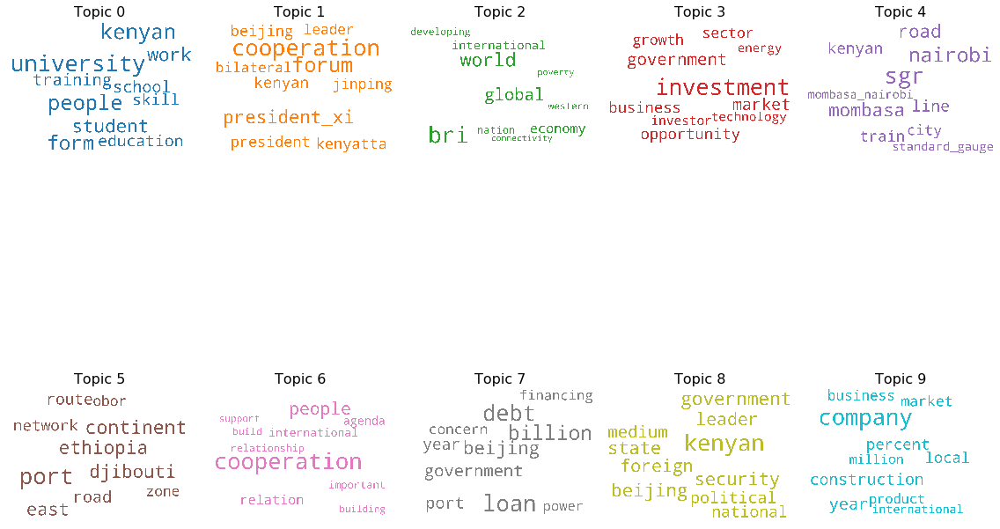

<Figure size 432x288 with 0 Axes>

In [178]:
# 1. Wordcloud of Top N words in each topic
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

stopwords = set(STOPWORDS)

cloud = WordCloud(stopwords=stopwords, background_color='white', width=2500, height=1800, max_words=10, colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i], prefer_horizontal=1.0)

topics = best_lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 5, figsize=(16,16), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()
plt.savefig('topics word cloud.jpg')

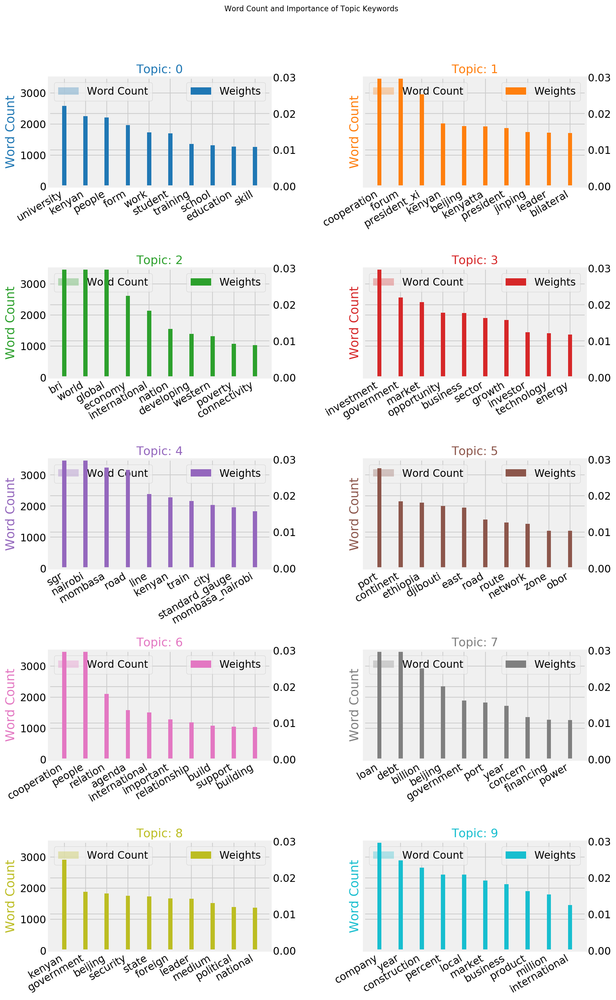

<Figure size 432x288 with 0 Axes>

In [51]:

for data in norm_corpus:
    data_ready = [nltk.word_tokenize(data)]
    for w_list in data_ready:
        w = w_list
topics = best_lda_model.show_topics(formatted=False)
data_flat = w
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 2, figsize=(12, 18), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=10, y=1.05)    
plt.show()
plt.savefig('key topics.png')

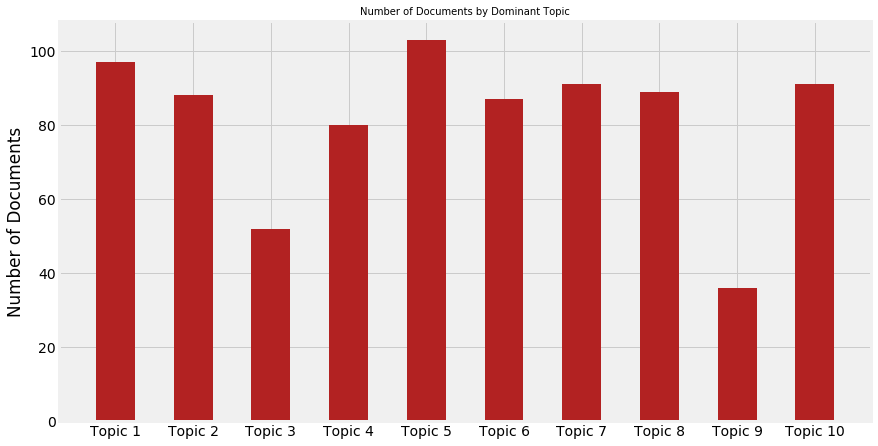

In [198]:
from matplotlib.ticker import FuncFormatter

# Plot
plt.figure(figsize=(12,6))
x = ['Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10']

# Topic Distribution by Dominant Topics
plt.bar(x, height='Doc Count', data=topic_stats_df, width=.5, color='firebrick')


plt.title('Number of Documents by Dominant Topic', fontdict=dict(size=10))

plt.ylabel('Number of Documents')
plt.tight_layout(pad=0)
plt.show()


plt.show()

In [206]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[bow_corpus]):
    topic_weights.append([w for i, w in row_list])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 766 samples in 0.160s...
[t-SNE] Computed neighbors for 766 samples in 0.666s...
[t-SNE] Computed conditional probabilities for sample 766 / 766
[t-SNE] Mean sigma: 0.000488
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.335823
[t-SNE] KL divergence after 1000 iterations: 0.302906


Loading BokehJS ...

###  Visualizing Topic Models

In [52]:
vis = pyLDAvis.gensim.prepare(lda_model, bow_corpus, dictionary)
pyLDAvis.display(vis)

## Topic Modeling for Chinese News Articles

In [53]:
#corpus bigram for chinese news media articles
chinese_tokenize_corpus = [nltk.word_tokenize(token) for token in norm_chinese_corpus]
chinese_bigram = gensim.models.Phrases(chinese_tokenize_corpus, min_count=20, threshold=20, delimiter=b'_')

chinese_bigram_model = gensim.models.phrases.Phraser(chinese_bigram)

chinese_norm_corpus_bigram = [chinese_bigram_model[token] for token in chinese_tokenize_corpus]

In [54]:
#build dictionary for the corpus
chinese_dictionary = Dictionary(chinese_norm_corpus_bigram)
print((list(chinese_dictionary.items())))

[(0, 'according'), (1, 'achieved'), (2, 'achievement'), (3, 'addressing'), (4, 'adopted'), (5, 'african'), (6, 'agenda'), (7, 'alleviation'), (8, 'alone'), (9, 'annual'), (10, 'area'), (11, 'back'), (12, 'bear'), (13, 'begun'), (14, 'beijing'), (15, 'belief'), (16, 'belt_road'), (17, 'benefit'), (18, 'bigger'), (19, 'billion'), (20, 'blazing'), (21, 'boosted'), (22, 'bri'), (23, 'building'), (24, 'built'), (25, 'cambodia'), (26, 'caput'), (27, 'centered'), (28, 'champion'), (29, 'china'), (30, 'chinese'), (31, 'clue'), (32, 'come'), (33, 'continued'), (34, 'contribution'), (35, 'cooperation'), (36, 'cost'), (37, 'country'), (38, 'created'), (39, 'data'), (40, 'day'), (41, 'deadline'), (42, 'decade'), (43, 'demonstration'), (44, 'design'), (45, 'developing'), (46, 'development'), (47, 'different'), (48, 'disabled'), (49, 'doubled'), (50, 'draw'), (51, 'drive'), (52, 'earlier'), (53, 'education'), (54, 'efficient'), (55, 'effort'), (56, 'elderly'), (57, 'elimination'), (58, 'empowerment'

In [55]:
# Filter out words that occur less than 20 documents, or more than 50% of the documents.
chinese_dictionary.filter_extremes(no_below=20, no_above=0.6)

print('Total Vocabulary Size:', len(dictionary))

Total Vocabulary Size: 2061


In [56]:
# Transforming corpus into bag of words vectors
chinese_bow_corpus = [chinese_dictionary.doc2bow(doc) for doc in chinese_norm_corpus_bigram]
print(chinese_bow_corpus[1][:50])

[(0, 2), (1, 1), (2, 1), (6, 1), (8, 1), (10, 1), (14, 1), (26, 1), (31, 1), (33, 1), (42, 2), (59, 3), (61, 1), (73, 2), (75, 1), (80, 1), (99, 1), (104, 1), (106, 1), (108, 3), (112, 1), (113, 1), (117, 1), (122, 1), (128, 1), (136, 1), (140, 1), (141, 2), (142, 1), (143, 1), (144, 1), (145, 1), (146, 1), (147, 1), (148, 1), (149, 2), (150, 1), (151, 1), (152, 2), (153, 2), (154, 1), (155, 1), (156, 1), (157, 1), (158, 1), (159, 1), (160, 1), (161, 1), (162, 1), (163, 1)]


In [57]:
# viewing actual terms and their counts
print([(chinese_dictionary[idx] , freq) for idx, freq in chinese_bow_corpus[3][:50]])

[('according', 1), ('area', 1), ('beijing', 1), ('belief', 1), ('contribution', 1), ('created', 1), ('different', 1), ('education', 1), ('effort', 2), ('first', 3), ('forum', 3), ('key', 1), ('many', 1), ('official', 1), ('part', 1), ('percent', 1), ('played', 1), ('promoting', 1), ('republic', 1), ('role', 1), ('since', 2), ('talk', 1), ('training', 1), ('world', 1), ('april', 1), ('kenyan', 1), ('president', 1), ('promote', 1), ('public', 1), ('region', 1), ('relation', 3), ('second', 1), ('work', 2), ('agreement', 2), ('aim', 1), ('among', 1), ('company', 1), ('held', 1), ('long', 1), ('signed', 1), ('along', 1), ('authorization_cdic', 1), ('better', 1), ('capacity', 1), ('capital', 1), ('close', 1), ('co_cdic', 1), ('committed', 1), ('communist_party', 1), ('construction', 1)]


In [58]:
# total papers in the corpus
print('Total number of papers:', len(chinese_bow_corpus))

Total number of papers: 343


In [59]:
#Topic Model
chinese_lda_model = gensim.models.LdaModel(corpus=chinese_bow_corpus, id2word=chinese_dictionary, num_topics=10, chunksize=1740, alpha='auto', 
                                   eta='auto', random_state=42, iterations=500, passes=20, eval_every=None)

In [60]:
#viewing the topics

for topic_id, topic in chinese_lda_model.print_topics(num_topics=10, num_words=10):
    pprint('Topic #'+str(topic_id+1)+':')
    pprint(topic)
    print()

'Topic #1:'
('0.041*"party" + 0.037*"green" + 0.020*"international" + 0.019*"political" + '
 '0.017*"center" + 0.017*"environmental" + 0.013*"global" + '
 '0.012*"environment" + 0.011*"innovation" + 0.009*"technology"')

'Topic #2:'
('0.017*"focac" + 0.012*"business" + 0.011*"investment" + '
 '0.010*"international" + 0.010*"need" + 0.010*"commercial" + 0.010*"capacity" '
 '+ 0.008*"economy" + 0.008*"conference" + 0.008*"held"')

'Topic #3:'
('0.023*"world" + 0.022*"bri" + 0.014*"global" + 0.011*"international" + '
 '0.010*"economy" + 0.009*"forum" + 0.008*"continent" + 0.008*"railway" + '
 '0.007*"beijing" + 0.007*"president_xi"')

'Topic #4:'
('0.047*"say" + 0.015*"kenyan" + 0.014*"university" + 0.012*"government" + '
 '0.011*"student" + 0.010*"education" + 0.010*"event" + 0.009*"technology" + '
 '0.008*"local" + 0.008*"work"')

'Topic #5:'
('0.013*"railway" + 0.012*"billion" + 0.012*"bank" + 0.012*"road" + '
 '0.010*"silk_road" + 0.009*"investment" + 0.008*"first" + '
 '0.008*"mariti

In [61]:
#overall mean coherence score
chinese_topic_coherences = chinese_lda_model.top_topics(bow_corpus, topn=10)
avg_coherence_score = np.mean([item[1] for item in chinese_topic_coherences])
print('Avg. Coherence Score:', avg_coherence_score)

Avg. Coherence Score: -2.4386276221399035


In [62]:
chinese_topics_with_wts = [item[0] for item in chinese_topic_coherences]
print('LDA Topics with Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    pprint('Topic #'+str(idx+1)+':')
    pprint([(term, round(wt, 3)) for wt, term in topic])
    print()

LDA Topics with Weights
'Topic #1:'
[('cooperation', 0.02),
 ('bri', 0.016),
 ('world', 0.011),
 ('global', 0.01),
 ('construction', 0.01),
 ('international', 0.009),
 ('company', 0.007),
 ('economy', 0.006),
 ('year', 0.005),
 ('investment', 0.005)]

'Topic #2:'
[('say', 0.014),
 ('bri', 0.012),
 ('world', 0.009),
 ('international', 0.008),
 ('year', 0.008),
 ('people', 0.007),
 ('percent', 0.007),
 ('many', 0.006),
 ('company', 0.005),
 ('cooperation', 0.005)]

'Topic #3:'
[('investment', 0.012),
 ('cooperation', 0.012),
 ('economy', 0.009),
 ('global', 0.007),
 ('year', 0.007),
 ('partner', 0.006),
 ('percent', 0.006),
 ('growth', 0.006),
 ('world', 0.006),
 ('opportunity', 0.006)]

'Topic #4:'
[('sgr', 0.019),
 ('company', 0.014),
 ('nairobi', 0.014),
 ('construction', 0.013),
 ('road', 0.013),
 ('kenyan', 0.012),
 ('train', 0.012),
 ('say', 0.011),
 ('year', 0.009),
 ('mombasa', 0.009)]

'Topic #5:'
[('investment', 0.011),
 ('say', 0.01),
 ('kenyan', 0.01),
 ('government', 0.009),

In [63]:
print('LDA Topics without Weights')
print('='*50)
for idx, topic in enumerate(chinese_topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([term for wt, term in topic])
    print()

LDA Topics without Weights
Topic #1:
['world', 'bri', 'global', 'international', 'economy', 'forum', 'continent', 'railway', 'beijing', 'president_xi']

Topic #2:
['business', 'international', 'company', 'guangzhou', 'service', 'form', 'beijing', 'reserved_content', 'text_photo', 'co_cdic']

Topic #3:
['focac', 'business', 'investment', 'international', 'need', 'commercial', 'capacity', 'economy', 'conference', 'held']

Topic #4:
['kenyan', 'relation', 'kenyatta', 'focac', 'agenda', 'international', 'summit', 'side', 'relationship', 'forum']

Topic #5:
['say', 'investment', 'market', 'government', 'policy', 'need', 'company', 'continent', 'global', 'world']

Topic #6:
['party', 'green', 'international', 'political', 'center', 'environmental', 'global', 'environment', 'innovation', 'technology']

Topic #7:
['company', 'construction', 'railway', 'port', 'say', 'local', 'percent', 'government', 'investment', 'road']

Topic #8:
['railway', 'billion', 'bank', 'road', 'silk_road', 'investmen

In [64]:
chinese_cv_coherence_lda_model = CoherenceModel(model=chinese_lda_model, texts=chinese_norm_corpus_bigram, corpus=chinese_bow_corpus, 
                                        dictionary=chinese_dictionary, topn=10)
avg_coherence_cv = chinese_cv_coherence_lda_model.get_coherence()

print('Avg. Coherence Score (Cv):', avg_coherence_cv)

Avg. Coherence Score (Cv): 0.4560660906378412


In [65]:
#LDA model with MALLET
os.environ.update({'MALLET_HOME':r'C:\Users\Gilbert\Desktop\mallet-2.0.8'})
MALLET_PATH = r"C:\Users\Gilbert\Desktop\mallet-2.0.8\bin\mallet"
chinese_lda_mallet = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=chinese_bow_corpus, num_topics=10, id2word=chinese_dictionary,
                                             iterations=500, workers=16)

In [66]:
topics = [[(term, round(wt, 3))
for term, wt in chinese_lda_mallet.show_topic(n, topn=10)]
for n in range(0, 10)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['forum', 'relation', 'international', 'president_xi', 'leader', 'summit', 'relationship', 'focac', 'effort', 'president']

Topic #2:
['railway', 'construction', 'sgr', 'mombasa_nairobi', 'mombasa', 'train', 'standard_gauge', 'built', 'transport', 'kenyan']

Topic #3:
['kenyan', 'form', 'kenyatta', 'reserved_content', 'multimedia_information', 'without_written', 'co_cdic', 'text_photo', 'etc_published', 'republished_used']

Topic #4:
['government', 'investment', 'benefit', 'good', 'ethiopia', 'financial', 'make', 'billion', 'tanzania', 'loan']

Topic #5:
['world', 'bri', 'global', 'international', 'route', 'road', 'silk_road', 'port', 'connectivity', 'beijing']

Topic #6:
['university', 'research', 'student', 'exchange', 'study', 'program', 'opportunity', 'medium', 'government', 'training']

Topic #7:
['company', 'market', 'business', 'service', 'product', 'overseas', 'industry', 'investment', 'percent', 'million']

Topic #8:
['technology', 'capacity', 'center', 'policy', 'po

In [67]:
#evaluate the model

chinese_cv_coherence_model_lda_mallet = CoherenceModel(model=chinese_lda_mallet, texts=chinese_norm_corpus_bigram, corpus=chinese_bow_corpus, 
                                              dictionary=chinese_dictionary, topn=10)

In [208]:
chinese_avg_coherence_cv = chinese_cv_coherence_model_lda_mallet.get_coherence()
print('Avg. Coherence Score (Cv):', avg_coherence_cv)

Avg. Coherence Score (Cv): 0.4868361055630154


### LDA Tuning For Chinese News Articles: Finding the Optimal Number of Topics

In [69]:
def chinese_topic_model_coherence_generator(corpus, texts, dictionary, start_topic_count=2, end_topic_count=10, step=1, cpus=1):
    models = []
    coherence_scores = []
    for topic_num in tqdm(range(start_topic_count, end_topic_count+1, step)):
        lda_mallet_model = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=corpus, num_topics=topic_num,
                                                            id2word=dictionary)
        cv_coherence_mallet = CoherenceModel(model=lda_mallet_model, texts=texts, corpus=corpus, dictionary=dictionary, topn=10)
        
        coherence_score = cv_coherence_mallet.get_coherence()
        coherence_scores.append(coherence_score)
        models.append(lda_mallet_model)
    return models, coherence_scores

In [70]:
chinese_lda_models, chinese_coherence_scores = chinese_topic_model_coherence_generator(chinese_bow_corpus, chinese_norm_corpus_bigram, chinese_dictionary, 
                                                                                       start_topic_count=2, end_topic_count=30,)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [21:38<00:00, 44.77s/it]


In [71]:
chinese_coherence_df = pd.DataFrame({'Number of Topics': range(2,31,1), 'Coherence Scores': np.round(chinese_coherence_scores, 4)})

chinese_coherence_df.sort_values(['Coherence Scores'], ascending=False).head(10)

,Number of Topics,Coherence Scores
23,25,0.5711
28,30,0.5646
21,23,0.5641
8,10,0.5636
18,20,0.5632
16,18,0.5599
20,22,0.5581
19,21,0.5577
9,11,0.5575
27,29,0.5537


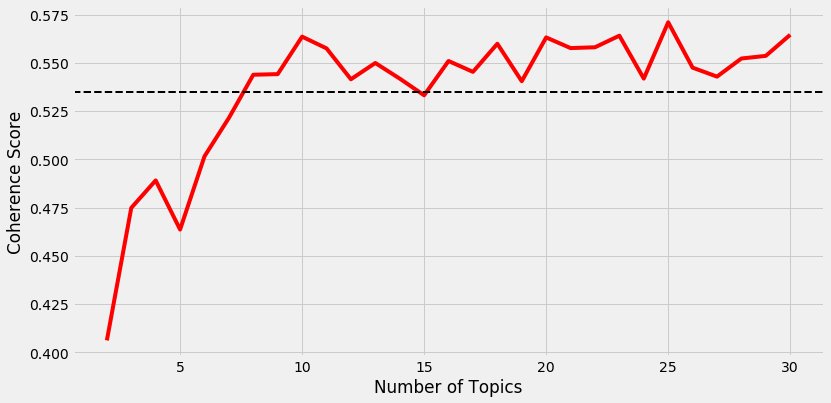

In [72]:
plt.style.use('fivethirtyeight')
x_ax = range(2, 31, 1)
y_ax = chinese_coherence_scores
plt.figure(figsize=(12, 6))
plt.plot(x_ax, y_ax, c='r')
plt.axhline(y=0.535, c='k', linestyle='--', linewidth=2)
plt.rcParams['figure.facecolor'] = 'white'
xl = plt.xlabel('Number of Topics')
yl = plt.ylabel('Coherence Score')

In [209]:
chinese_best_model_idx = chinese_coherence_df[chinese_coherence_df["Number of Topics"] == 10].index[0]
chinese_best_lda_model = chinese_lda_models[chinese_best_model_idx]
chinese_best_lda_model.num_topics

10

In [210]:
topics = [[(term, round(wt, 3))
for term, wt in chinese_best_lda_model.show_topic(n, topn=10)]
for n in range(0, chinese_best_lda_model.num_topics)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['railway', 'sgr', 'construction', 'kenyan', 'nairobi', 'mombasa_nairobi', 'train', 'mombasa', 'standard_gauge', 'transport']

Topic #2:
['international', 'wang', 'form', 'including_limited', 'daily_information', 'authorization_cdic', 'co_cdic', 'content_shall', 'site_belongs', 'copyright_right']

Topic #3:
['port', 'road', 'billion', 'region', 'report', 'route', 'ethiopia', 'city', 'east', 'silk_road']

Topic #4:
['government', 'policy', 'loan', 'party', 'benefit', 'foreign', 'regional', 'public', 'make', 'official']

Topic #5:
['percent', 'service', 'technology', 'growth', 'million', 'poverty', 'market', 'financial', 'number', 'past']

Topic #6:
['relation', 'forum', 'future', 'relationship', 'role', 'great', 'focac', 'agenda', 'president', 'leader']

Topic #7:
['continent', 'investment', 'south', 'economy', 'global', 'percent', 'energy', 'bank', 'partner', 'billion']

Topic #8:
['world', 'bri', 'international', 'global', 'building', 'forum', 'xi', 'common', 'open', 'win_wi

In [211]:
chinese_topics_df = pd.DataFrame([[term for term, wt in topic] for topic in topics], columns = ['Term'+str(i) for i in range(1, 11)],
                            index=['Topic '+str(t) for t in range(1, chinese_best_lda_model.num_topics+1)]).T
chinese_topics_df

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
Term1,railway,international,port,government,percent,relation,continent,world,university,company
Term2,sgr,wang,road,policy,service,forum,investment,bri,work,business
Term3,construction,form,billion,loan,technology,future,south,international,research,market
Term4,kenyan,including_limited,region,party,growth,relationship,economy,global,student,local
Term5,nairobi,daily_information,report,benefit,million,role,global,building,exchange,investment
Term6,mombasa_nairobi,authorization_cdic,route,foreign,poverty,great,percent,forum,study,construction
Term7,train,co_cdic,ethiopia,regional,market,focac,energy,xi,program,product
Term8,mombasa,content_shall,city,public,financial,agenda,bank,common,training,enterprise
Term9,standard_gauge,site_belongs,east,make,number,president,partner,open,kenyan,overseas
Term10,transport,copyright_right,silk_road,official,past,leader,billion,win_win,education,opportunity


In [212]:
pd.set_option('display.max_colwidth', -1) 
chinese_topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], 
                         index=['Topic ' + str(t) for t in range(1, chinese_best_lda_model.num_topics+1)])
chinese_topics_df

,Terms per Topic
Topic 1,"railway, sgr, construction, kenyan, nairobi, mombasa_nairobi, train, mombasa, standard_gauge, transport"
Topic 2,"international, wang, form, including_limited, daily_information, authorization_cdic, co_cdic, content_shall, site_belongs, copyright_right"
Topic 3,"port, road, billion, region, report, route, ethiopia, city, east, silk_road"
Topic 4,"government, policy, loan, party, benefit, foreign, regional, public, make, official"
Topic 5,"percent, service, technology, growth, million, poverty, market, financial, number, past"
Topic 6,"relation, forum, future, relationship, role, great, focac, agenda, president, leader"
Topic 7,"continent, investment, south, economy, global, percent, energy, bank, partner, billion"
Topic 8,"world, bri, international, global, building, forum, xi, common, open, win_win"
Topic 9,"university, work, research, student, exchange, study, program, training, kenyan, education"
Topic 10,"company, business, market, local, investment, construction, product, enterprise, overseas, opportunity"


### Interpreting Topic Model Results For Chinese News Aticles

In [213]:
#Distribution of topics in each document
chinese_tm_results = chinese_best_lda_model[chinese_bow_corpus]
chinese_tm_results

[[(0, 0.09286097691894793),
  (1, 0.04186795491143317),
  (2, 0.06387546967257113),
  (3, 0.10144927536231885),
  (4, 0.2404723564143854),
  (5, 0.11272141706924316),
  (6, 0.06709608158883522),
  (7, 0.15083199141170156),
  (8, 0.07246376811594203),
  (9, 0.05636070853462158)],
 [(0, 0.0756172839506173),
  (1, 0.08641975308641976),
  (2, 0.03935185185185186),
  (3, 0.09722222222222224),
  (4, 0.05709876543209877),
  (5, 0.300925925925926),
  (6, 0.0462962962962963),
  (7, 0.17129629629629634),
  (8, 0.07098765432098766),
  (9, 0.05478395061728396)],
 [(0, 0.07333333333333333),
  (1, 0.056666666666666664),
  (2, 0.08222222222222222),
  (3, 0.07888888888888888),
  (4, 0.09666666666666666),
  (5, 0.18),
  (6, 0.11888888888888889),
  (7, 0.11444444444444445),
  (8, 0.06333333333333334),
  (9, 0.13555555555555557)],
 [(0, 0.032088122605363985),
  (1, 0.14942528735632185),
  (2, 0.05938697318007663),
  (3, 0.06848659003831417),
  (4, 0.04597701149425287),
  (5, 0.15900383141762453),
  (6, 0

In [214]:
#dominant topic in each document
chinese_corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in chinese_tm_results]
chinese_corpus_topics[:5]

[(4, 0.2404723564143854),
 (5, 0.300925925925926),
 (5, 0.18),
 (8, 0.3132183908045977),
 (8, 0.30486685032139577)]

In [215]:
chinese_corpus_topic_df = pd.DataFrame()
chinese_corpus_topic_df['Document'] = range(0, len(norm_chinese_corpus))
chinese_corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in chinese_corpus_topics]
chinese_corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in chinese_corpus_topics]
chinese_corpus_topic_df['Topic Desc'] = [chinese_topics_df.iloc[t[0]]['Terms per Topic'] for t in chinese_corpus_topics]
chinese_corpus_topic_df['Article'] = norm_chinese_corpus

In [216]:
pd.set_option('display.max_colwidth', 200)
chinese_topic_stats_df = chinese_corpus_topic_df.groupby('Dominant Topic').agg({'Dominant Topic': {'Doc Count': np.size, '% Total Docs': np.size }})

chinese_topic_stats_df = chinese_topic_stats_df['Dominant Topic'].reset_index()
chinese_topic_stats_df['% Total Docs'] = chinese_topic_stats_df['% Total Docs'].apply(lambda row: round((row*100) / len(norm_chinese_corpus), 2))
chinese_topic_stats_df['Topic Desc'] = [chinese_topics_df.iloc[t]['Terms per Topic'] for t in range(len(chinese_topic_stats_df))]
chinese_topic_stats_df

,Dominant Topic,Doc Count,% Total Docs,Topic Desc
0,1,56,16.33,"railway, sgr, construction, kenyan, nairobi, mombasa_nairobi, train, mombasa, standard_gauge, transport"
1,2,30,8.75,"international, wang, form, including_limited, daily_information, authorization_cdic, co_cdic, content_shall, site_belongs, copyright_right"
2,3,33,9.62,"port, road, billion, region, report, route, ethiopia, city, east, silk_road"
3,4,21,6.12,"government, policy, loan, party, benefit, foreign, regional, public, make, official"
4,5,30,8.75,"percent, service, technology, growth, million, poverty, market, financial, number, past"
5,6,43,12.54,"relation, forum, future, relationship, role, great, focac, agenda, president, leader"
6,7,14,4.08,"continent, investment, south, economy, global, percent, energy, bank, partner, billion"
7,8,38,11.08,"world, bri, international, global, building, forum, xi, common, open, win_win"
8,9,33,9.62,"university, work, research, student, exchange, study, program, training, kenyan, education"
9,10,45,13.12,"company, business, market, local, investment, construction, product, enterprise, overseas, opportunity"


In [217]:
pd.set_option('display.max_colwidth', 80)
(chinese_corpus_topic_df[chinese_corpus_topic_df['Document'].isin([681, 9, 392, 1622, 17, 906, 996, 503, 13, 733])])

,Document,Dominant Topic,Contribution %,Topic Desc,Article
9,9,2,31.76,"international, wang, form, including_limited, daily_information, authorizati...",group foreign guest four day tour beijing last week explore city cultural ch...
13,13,9,24.52,"university, work, research, student, exchange, study, program, training, ken...",pursuing belt road initiative china working closely kenya country field incl...
17,17,10,28.01,"company, business, market, local, investment, construction, product, enterpr...",fifth edition china trade week ctw kenya kicked wednesday high expectation s...


In [218]:
chinese_corpus_topic_df.groupby('Dominant Topic').apply(lambda topic_set:( topic_set.sort_values(by=['Contribution %'],ascending=False).iloc[0]))

,Document,Dominant Topic,Contribution %,Topic Desc,Article
Dominant Topic,,,,,
1,279,1,48.53,"railway, sgr, construction, kenyan, nairobi, mombasa_nairobi, train, mombasa...",mombasa kenya xinhua kenyan president uhuru kenyatta wednesday launched pass...
2,81,2,34.25,"international, wang, form, including_limited, daily_information, authorizati...",china united nation environment programme inaugurated interim secretariat ov...
3,161,3,39.45,"port, road, billion, region, report, route, ethiopia, city, east, silk_road",china rolling major documentary series diplomatic principle practice achieve...
4,95,4,35.42,"government, policy, loan, party, benefit, foreign, regional, public, make, o...",day conference communist party china cpc african political party came end ju...
5,97,5,48.61,"percent, service, technology, growth, million, poverty, market, financial, n...",continent aim attract chinese tourist direct flight eased visa policy unforg...
6,107,6,40.24,"relation, forum, future, relationship, role, great, focac, agenda, president...",th arrived nairobi green city sun started tenure th chinese ambassador kenya...
7,264,7,67.20,"continent, investment, south, economy, global, percent, energy, bank, partne...",president xi jinping visit africa begin july last july perceived significant...
8,268,8,49.73,"world, bri, international, global, building, forum, xi, common, open, win_win",chinese president xi jinping delivers keynote speech opening annual meeting ...
9,226,9,46.61,"university, work, research, student, exchange, study, program, training, ken...",nairobi aug xinhua terry murage grew middle class suburb kenyan capital nair...


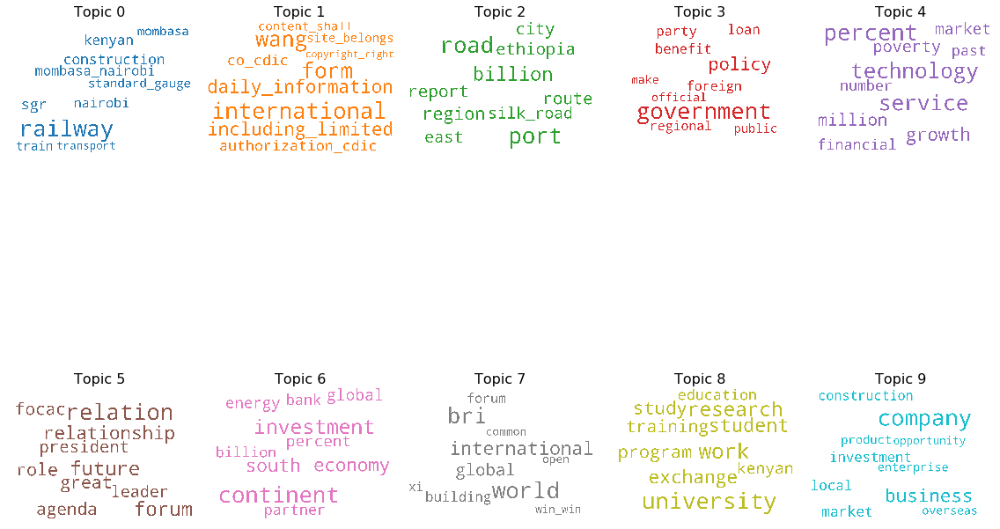

In [220]:
# 1. Wordcloud of Top N words in each topic
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

stopwords = set(STOPWORDS)

cloud = WordCloud(stopwords=stopwords, background_color='white', width=2500, height=1800, max_words=10, colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i], prefer_horizontal=1.0)

topics = chinese_best_lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 5, figsize=(16,16), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

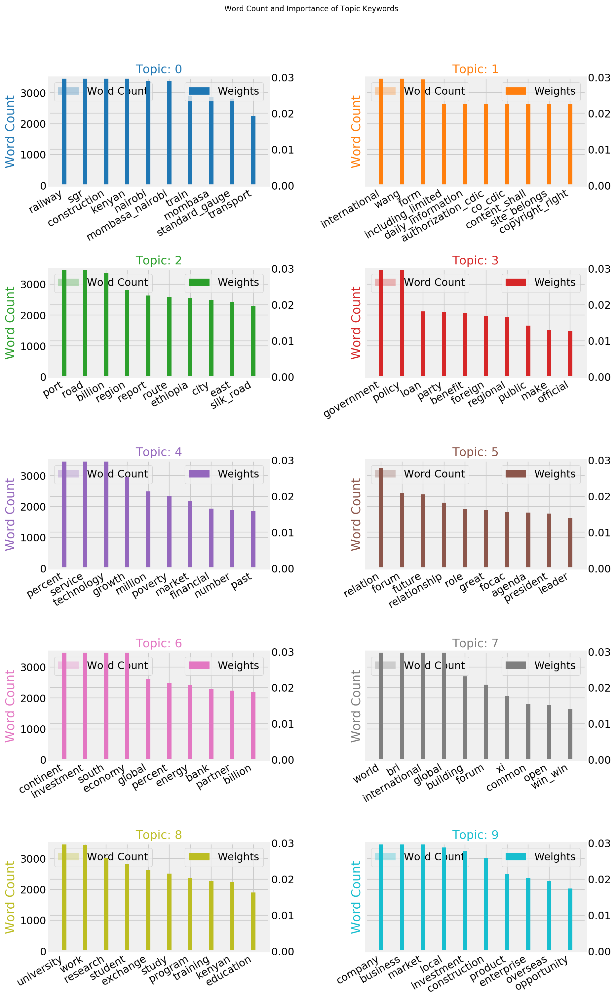

In [221]:
for data in norm_chinese_corpus:
    data_ready = [nltk.word_tokenize(data)]
    for w_list in data_ready:
        w = w_list
topics = chinese_best_lda_model.show_topics(formatted=False)
data_flat = w
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 2, figsize=(12, 18), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=10, y=1.05)    
plt.show()

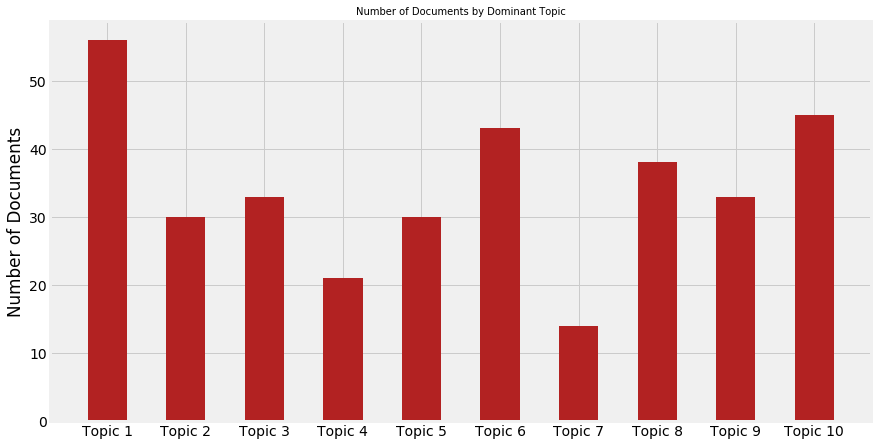

In [207]:
# Plot
plt.figure(figsize=(12,6))
x = ['Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10']

# Topic Distribution by Dominant Topics
plt.bar(x, height='Doc Count', data=chinese_topic_stats_df, width=.5, color='firebrick')

plt.title('Number of Documents by Dominant Topic', fontdict=dict(size=10))

plt.ylabel('Number of Documents')
plt.tight_layout(pad=0)
plt.show()

plt.show()

### Visualizing Topic Models For Chinese News Aticles

In [88]:
chinese_vis = pyLDAvis.gensim.prepare(chinese_lda_model, chinese_bow_corpus, chinese_dictionary)
pyLDAvis.display(chinese_vis)

## Topic Modeling for Local News Articles

In [89]:
#corpus bigram for local news articles
local_tokenize_corpus = [nltk.word_tokenize(token) for token in norm_local_corpus]
local_bigram = gensim.models.Phrases(local_tokenize_corpus, min_count=20, threshold=20, delimiter=b'_')

local_bigram_model = gensim.models.phrases.Phraser(local_bigram)

local_norm_corpus_bigram = [local_bigram_model[token] for token in local_tokenize_corpus]

In [90]:
#build dictionary for the local news articles
local_dictionary = Dictionary(local_norm_corpus_bigram)
print((list(local_dictionary.items())))

[(0, 'abruptly'), (1, 'according'), (2, 'across'), (3, 'adopting'), (4, 'africa'), (5, 'african'), (6, 'ago'), (7, 'ahead'), (8, 'allow'), (9, 'already'), (10, 'alternativeand'), (11, 'ambassador'), (12, 'amid'), (13, 'among'), (14, 'anti'), (15, 'appeared'), (16, 'approach'), (17, 'approving'), (18, 'april'), (19, 'around'), (20, 'asked'), (21, 'attack'), (22, 'attained'), (23, 'auditing'), (24, 'authorized'), (25, 'away'), (26, 'back'), (27, 'backed'), (28, 'balked'), (29, 'bank'), (30, 'banked'), (31, 'based'), (32, 'basis'), (33, 'become'), (34, 'beginning'), (35, 'beijing'), (36, 'belt_road'), (37, 'beyond'), (38, 'bid'), (39, 'biggest'), (40, 'billion'), (41, 'bloomberg'), (42, 'bode'), (43, 'boost'), (44, 'border'), (45, 'brake'), (46, 'bridge'), (47, 'budget'), (48, 'build'), (49, 'building'), (50, 'built'), (51, 'came'), (52, 'canceled'), (53, 'capital_nairobi'), (54, 'catch'), (55, 'cautious'), (56, 'center'), (57, 'central'), (58, 'china'), (59, 'chinese'), (60, 'cite'), (61

In [91]:
# Filter out words that occur less than 20 documents, or more than 50% of the documents.
local_dictionary.filter_extremes(no_below=20, no_above=0.6)

print('Total Vocabulary Size:', len(local_dictionary))

Total Vocabulary Size: 1136


In [92]:
# Transforming corpus into bag of words vectors
local_bow_corpus = [local_dictionary.doc2bow(doc) for doc in local_norm_corpus_bigram]
print(local_bow_corpus[1][:50])

[(0, 1), (2, 3), (26, 1), (28, 1), (48, 1), (77, 1), (88, 1), (91, 1), (103, 1), (106, 1), (119, 2), (130, 1), (154, 1), (155, 1), (156, 1), (161, 1), (176, 1), (186, 2), (189, 2), (193, 1), (211, 1), (212, 2), (215, 1), (219, 1), (223, 1), (225, 1), (226, 1), (227, 2), (228, 3), (229, 1), (230, 1), (231, 1), (232, 1), (233, 1), (234, 1), (235, 1), (236, 1), (237, 1), (238, 1), (239, 1), (240, 1), (241, 1), (242, 1), (243, 1), (244, 1), (245, 1), (246, 1), (247, 1), (248, 1), (249, 1)]


In [93]:
# viewing actual terms and their counts
print([(local_dictionary[idx] , freq) for idx, freq in local_bow_corpus[3][:50]])

[('according', 1), ('african', 1), ('beyond', 1), ('build', 2), ('built', 1), ('capital_nairobi', 1), ('city', 1), ('construction', 1), ('government', 1), ('hit', 1), ('involved', 1), ('kenyatta', 1), ('largest', 1), ('local', 2), ('many', 1), ('mombasa_nairobi', 1), ('nairobi', 2), ('nation', 1), ('needed', 1), ('point', 1), ('port', 1), ('president', 2), ('president_uhuru', 1), ('quality', 1), ('release', 1), ('report', 2), ('road_bridge', 1), ('sgr', 5), ('standard_gauge', 1), ('time', 1), ('trade', 1), ('transport', 1), ('way', 1), ('continent', 1), ('cooperation', 1), ('drive', 1), ('estimated', 1), ('km', 1), ('opportunity', 1), ('people', 1), ('road', 1), ('skill', 1), ('training', 1), ('added', 1), ('along', 1), ('benefit', 1), ('capacity', 1), ('ceremony', 1), ('company', 6), ('connecting', 1)]


In [94]:
# total papers in the corpus
print('Total number of papers:', len(local_bow_corpus))

Total number of papers: 412


In [95]:
#Topic Model
local_lda_model = gensim.models.LdaModel(corpus=local_bow_corpus, id2word=local_dictionary, num_topics=10, chunksize=1740, alpha='auto', 
                                   eta='auto', random_state=42, iterations=500, passes=20, eval_every=None)

In [96]:
#viewing the topics
for topic_id, topic in local_lda_model.print_topics(num_topics=10, num_words=10):
    pprint('Topic #'+str(topic_id+1)+':')
    pprint(topic)
    print()

'Topic #1:'
('0.015*"port" + 0.014*"line" + 0.014*"loan" + 0.014*"sgr" + 0.013*"debt" + '
 '0.012*"government" + 0.011*"billion" + 0.010*"construction" + 0.009*"uganda" '
 '+ 0.009*"year"')

'Topic #2:'
('0.022*"form" + 0.020*"reserved_content" + 0.020*"text_photo" + '
 '0.020*"site_belongs" + 0.020*"without_written" + 0.020*"including_limited" + '
 '0.020*"republished_used" + 0.020*"content_shall" + '
 '0.020*"authorization_cdic" + 0.020*"copyright_right"')

'Topic #3:'
('0.074*"bri" + 0.013*"cooperation" + 0.012*"world" + 0.012*"connectivity" + '
 '0.011*"silk_road" + 0.011*"digital" + 0.010*"economy" + 0.009*"global" + '
 '0.009*"participating" + 0.008*"investment"')

'Topic #4:'
('0.022*"debt" + 0.019*"loan" + 0.014*"government" + 0.014*"beijing" + '
 '0.012*"bri" + 0.010*"study" + 0.010*"asset" + 0.010*"report" + '
 '0.009*"contract" + 0.008*"corruption"')

'Topic #5:'
('0.016*"african" + 0.015*"cooperation" + 0.010*"trade" + 0.010*"bri" + '
 '0.008*"investment" + 0.007*"internati

In [97]:
#overall mean coherence score
local_topic_coherences = local_lda_model.top_topics(local_bow_corpus, topn=10)
local_avg_coherence_score = np.mean([item[1] for item in local_topic_coherences])
print('Avg. Coherence Score:', local_avg_coherence_score)

Avg. Coherence Score: -0.8483595808781181


In [98]:
local_topics_with_wts = [item[0] for item in local_topic_coherences]
print('LDA Topics with Weights')
print('='*50)
for idx, topic in enumerate(local_topics_with_wts):
    pprint('Topic #'+str(idx+1)+':')
    pprint([(term, round(wt, 3)) for wt, term in topic])
    print()

LDA Topics with Weights
'Topic #1:'
[('form', 0.022),
 ('reserved_content', 0.02),
 ('text_photo', 0.02),
 ('site_belongs', 0.02),
 ('without_written', 0.02),
 ('including_limited', 0.02),
 ('republished_used', 0.02),
 ('content_shall', 0.02),
 ('authorization_cdic', 0.02),
 ('copyright_right', 0.02)]

'Topic #2:'
[('african', 0.016),
 ('cooperation', 0.015),
 ('trade', 0.01),
 ('bri', 0.01),
 ('investment', 0.008),
 ('international', 0.007),
 ('people', 0.007),
 ('region', 0.006),
 ('many', 0.006),
 ('year', 0.006)]

'Topic #3:'
[('president', 0.016),
 ('government', 0.015),
 ('bri', 0.015),
 ('president_kenyatta', 0.014),
 ('sh_billion', 0.014),
 ('investment', 0.012),
 ('trade', 0.011),
 ('business', 0.011),
 ('forum', 0.011),
 ('nairobi', 0.01)]

'Topic #4:'
[('port', 0.015),
 ('line', 0.014),
 ('loan', 0.014),
 ('sgr', 0.014),
 ('debt', 0.013),
 ('government', 0.012),
 ('billion', 0.011),
 ('construction', 0.01),
 ('uganda', 0.009),
 ('year', 0.009)]

'Topic #5:'
[('train', 0.016)

In [99]:
print('LDA Topics without Weights')
print('='*50)
for idx, topic in enumerate(local_topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([term for wt, term in topic])
    print()

LDA Topics without Weights
Topic #1:
['form', 'reserved_content', 'text_photo', 'site_belongs', 'without_written', 'including_limited', 'republished_used', 'content_shall', 'authorization_cdic', 'copyright_right']

Topic #2:
['african', 'cooperation', 'trade', 'bri', 'investment', 'international', 'people', 'region', 'many', 'year']

Topic #3:
['president', 'government', 'bri', 'president_kenyatta', 'sh_billion', 'investment', 'trade', 'business', 'forum', 'nairobi']

Topic #4:
['port', 'line', 'loan', 'sgr', 'debt', 'government', 'billion', 'construction', 'uganda', 'year']

Topic #5:
['train', 'sgr', 'nairobi', 'company', 'say', 'road', 'service', 'government', 'line', 'construction']

Topic #6:
['african', 'beijing', 'world', 'leader', 'trade', 'cooperation', 'global', 'president', 'nation', 'security']

Topic #7:
['trade', 'market', 'export', 'opportunity', 'bank', 'product', 'investment', 'growth', 'import', 'local']

Topic #8:
['bri', 'cooperation', 'world', 'connectivity', 'silk

In [100]:
local_cv_coherence_lda_model = CoherenceModel(model=local_lda_model, texts=local_norm_corpus_bigram, corpus=local_bow_corpus, dictionary=local_dictionary, 
                                        topn=10)
local_avg_coherence_cv = local_cv_coherence_lda_model.get_coherence()

print('Avg. Coherence Score (Cv):', local_avg_coherence_cv)

Avg. Coherence Score (Cv): 0.5418306442065745


In [101]:
#LDA model with MALLET
os.environ.update({'MALLET_HOME':r'C:\Users\Gilbert\Desktop\mallet-2.0.8'})
MALLET_PATH = r"C:\Users\Gilbert\Desktop\mallet-2.0.8\bin\mallet"
local_lda_mallet = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=local_bow_corpus, num_topics=10, id2word=local_dictionary,
                                             iterations=500, workers=16)

In [102]:
topics = [[(term, round(wt, 3))
for term, wt in local_lda_mallet.show_topic(n, topn=10)]
for n in range(0, 10)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['local', 'university', 'work', 'company', 'energy', 'form', 'event', 'high', 'technology', 'job']

Topic #2:
['bri', 'world', 'global', 'silk_road', 'economy', 'trade', 'international', 'cooperation', 'asia', 'forum']

Topic #3:
['port', 'djibouti', 'agreement', 'asset', 'ethiopia', 'year', 'state', 'contract', 'power', 'pay']

Topic #4:
['trade', 'market', 'export', 'international', 'product', 'company', 'percent', 'deal', 'increase', 'local']

Topic #5:
['african', 'beijing', 'continent', 'world', 'security', 'leader', 'political', 'global', 'policy', 'influence']

Topic #6:
['president', 'government', 'president_kenyatta', 'sh_billion', 'part', 'leader', 'industrial', 'business', 'forum', 'city']

Topic #7:
['investment', 'opportunity', 'regional', 'bank', 'growth', 'key', 'financial', 'sector', 'important', 'provide']

Topic #8:
['debt', 'loan', 'billion', 'government', 'beijing', 'concern', 'funding', 'plan', 'financing', 'fund']

Topic #9:
['sgr', 'nairobi', 'line', 'r

In [103]:
#evaluate the model
local_cv_coherence_model_lda_mallet = CoherenceModel(model=local_lda_mallet, texts=local_norm_corpus_bigram, corpus=local_bow_corpus, 
                                              dictionary=local_dictionary, topn=10)

In [104]:
local_avg_coherence_cv = local_cv_coherence_model_lda_mallet.get_coherence()
print('Avg. Coherence Score (Cv):', local_avg_coherence_cv)

Avg. Coherence Score (Cv): 0.5084607221364454


### LDA Tuning: Finding the Optimal Number of Topics in Local News Articles

In [105]:
def local_topic_model_coherence_generator(corpus, texts, dictionary, start_topic_count=2, end_topic_count=10, step=1, cpus=1):
    models = []
    coherence_scores = []
    for topic_num in tqdm(range(start_topic_count, end_topic_count+1, step)):
        lda_mallet_model = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=corpus, num_topics=topic_num,
                                                            id2word=dictionary)
        cv_coherence_mallet = CoherenceModel(model=lda_mallet_model, texts=texts, corpus=corpus, dictionary=dictionary, topn=10)
        
        coherence_score = cv_coherence_mallet.get_coherence()
        coherence_scores.append(coherence_score)
        models.append(lda_mallet_model)
    return models, coherence_scores

In [106]:
local_lda_models, local_coherence_scores = local_topic_model_coherence_generator(local_bow_corpus, local_norm_corpus_bigram, local_dictionary, 
                                                                                 start_topic_count=2, end_topic_count=30)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [21:03<00:00, 43.55s/it]


In [107]:
local_coherence_df = pd.DataFrame({'Number of Topics': range(2,31,1), 'Coherence Scores': np.round(local_coherence_scores, 4)})

local_coherence_df.sort_values(['Coherence Scores'], ascending=False).head(10)

,Number of Topics,Coherence Scores
18,20,0.5482
19,21,0.5456
27,29,0.5434
26,28,0.5419
23,25,0.5409
28,30,0.5358
24,26,0.5333
21,23,0.5327
17,19,0.5320
12,14,0.5313


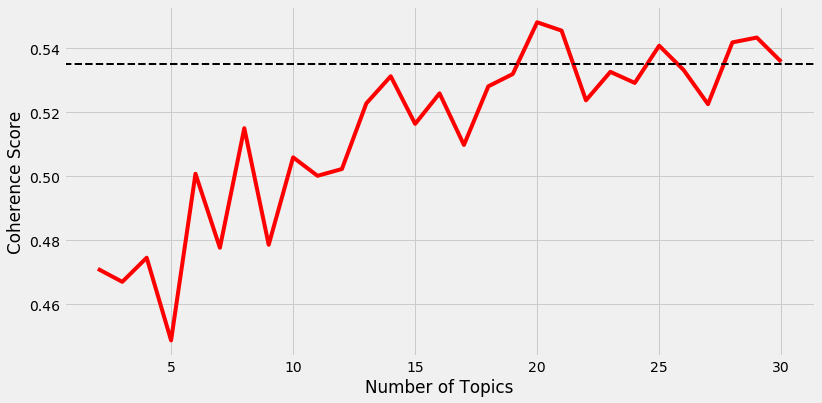

In [108]:
plt.style.use('fivethirtyeight')
x_ax = range(2, 31, 1)
y_ax = local_coherence_scores
plt.figure(figsize=(12, 6))
plt.plot(x_ax, y_ax, c='r')
plt.axhline(y=0.535, c='k', linestyle='--', linewidth=2)
plt.rcParams['figure.facecolor'] = 'white'
xl = plt.xlabel('Number of Topics')
yl = plt.ylabel('Coherence Score')

In [109]:
local_best_model_idx = local_coherence_df[coherence_df["Number of Topics"] == 10].index[0]
local_best_lda_model = local_lda_models[local_best_model_idx]
local_best_lda_model.num_topics

10

In [110]:
topics = [[(term, round(wt, 3))
for term, wt in local_best_lda_model.show_topic(n, topn=10)]
for n in range(0, local_best_lda_model.num_topics)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['debt', 'loan', 'beijing', 'port', 'government', 'report', 'billion', 'state', 'asset', 'money']

Topic #2:
['cooperation', 'forum', 'people', 'president_xi', 'jinping', 'summit', 'exchange', 'partnership', 'beijing', 'leader']

Topic #3:
['local', 'construction', 'work', 'year', 'government', 'company', 'university', 'energy', 'million', 'technology']

Topic #4:
['sgr', 'line', 'mombasa', 'nairobi', 'train', 'cost', 'port', 'transport', 'rail', 'standard_gauge']

Topic #5:
['people', 'opportunity', 'business', 'form', 'ambassador', 'enterprise', 'community', 'international', 'relation', 'benefit']

Topic #6:
['african', 'continent', 'djibouti', 'security', 'political', 'ethiopia', 'strategic', 'regional', 'interest', 'foreign']

Topic #7:
['investment', 'bri', 'business', 'connectivity', 'industrial', 'including', 'president_kenyatta', 'president', 'service', 'benefit']

Topic #8:
['bri', 'world', 'global', 'international', 'economy', 'nation', 'developing', 'western', 'reg

In [111]:
local_topics_df = pd.DataFrame([[term for term, wt in topic] for topic in topics], columns = ['Term'+str(i) for i in range(1, 11)],
                            index=['Topic '+str(t) for t in range(1, local_best_lda_model.num_topics+1)]).T
local_topics_df

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
Term1,debt,cooperation,local,sgr,people,african,investment,bri,trade,government
Term2,loan,forum,construction,line,opportunity,continent,bri,world,market,kenyatta
Term3,beijing,people,work,mombasa,business,djibouti,business,global,investment,road
Term4,port,president_xi,year,nairobi,form,security,connectivity,international,export,president
Term5,government,jinping,government,train,ambassador,political,industrial,economy,company,part
Term6,report,summit,company,cost,enterprise,ethiopia,including,nation,product,nairobi
Term7,billion,exchange,university,port,community,strategic,president_kenyatta,developing,bank,expected
Term8,state,partnership,energy,transport,international,regional,president,western,deal,sh_billion
Term9,asset,beijing,million,rail,relation,interest,service,region,asia,funding
Term10,money,leader,technology,standard_gauge,benefit,foreign,benefit,power,billion,national


In [112]:
pd.set_option('display.max_colwidth', -1) 
local_topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], 
                         index=['Topic ' + str(t) for t in range(1, local_best_lda_model.num_topics+1)])
local_topics_df

,Terms per Topic
Topic 1,"debt, loan, beijing, port, government, report, billion, state, asset, money"
Topic 2,"cooperation, forum, people, president_xi, jinping, summit, exchange, partnership, beijing, leader"
Topic 3,"local, construction, work, year, government, company, university, energy, million, technology"
Topic 4,"sgr, line, mombasa, nairobi, train, cost, port, transport, rail, standard_gauge"
Topic 5,"people, opportunity, business, form, ambassador, enterprise, community, international, relation, benefit"
Topic 6,"african, continent, djibouti, security, political, ethiopia, strategic, regional, interest, foreign"
Topic 7,"investment, bri, business, connectivity, industrial, including, president_kenyatta, president, service, benefit"
Topic 8,"bri, world, global, international, economy, nation, developing, western, region, power"
Topic 9,"trade, market, investment, export, company, product, bank, deal, asia, billion"
Topic 10,"government, kenyatta, road, president, part, nairobi, expected, sh_billion, funding, national"


### Interpreting Topic Model Results For Local News Articles

In [113]:
#Distribution of topics in each document
local_tm_results = local_best_lda_model[local_bow_corpus]
local_tm_results

[[(0, 0.21523809523809523),
  (1, 0.02158730158730159),
  (2, 0.05492063492063492),
  (3, 0.2895238095238095),
  (4, 0.030476190476190476),
  (5, 0.08190476190476191),
  (6, 0.04126984126984127),
  (7, 0.03619047619047619),
  (8, 0.11142857142857143),
  (9, 0.11746031746031746)],
 [(0, 0.045351473922902494),
  (1, 0.0982615268329554),
  (2, 0.2494331065759637),
  (3, 0.12622826908541193),
  (4, 0.08390022675736962),
  (5, 0.11337868480725624),
  (6, 0.06575963718820861),
  (7, 0.06046863189720333),
  (8, 0.0710506424792139),
  (9, 0.08616780045351474)],
 [(0, 0.0420875420875421),
  (1, 0.13075196408529743),
  (2, 0.09147025813692482),
  (3, 0.23288439955106624),
  (4, 0.1352413019079686),
  (5, 0.08922558922558924),
  (6, 0.1038159371492705),
  (7, 0.05499438832772167),
  (8, 0.04938271604938272),
  (9, 0.07014590347923683)],
 [(0, 0.06368563685636858),
  (1, 0.06639566395663958),
  (2, 0.12127371273712739),
  (3, 0.18834688346883474),
  (4, 0.11382113821138214),
  (5, 0.08807588075880

In [114]:
#dominant topic in each document
local_corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in local_tm_results]
local_corpus_topics[:5]

[(3, 0.2895238095238095),
 (2, 0.2494331065759637),
 (3, 0.23288439955106624),
 (3, 0.18834688346883474),
 (1, 0.2391713747645951)]

In [115]:
local_corpus_topic_df = pd.DataFrame()
local_corpus_topic_df['Document'] = range(0, len(norm_local_corpus))
local_corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in local_corpus_topics]
local_corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in local_corpus_topics]
local_corpus_topic_df['Topic Desc'] = [local_topics_df.iloc[t[0]]['Terms per Topic'] for t in local_corpus_topics]
local_corpus_topic_df['Article'] = norm_local_corpus

In [116]:
pd.set_option('display.max_colwidth', 200)
local_topic_stats_df = local_corpus_topic_df.groupby('Dominant Topic').agg({'Dominant Topic': {'Doc Count': np.size, '% Total Docs': np.size }})

local_topic_stats_df = local_topic_stats_df['Dominant Topic'].reset_index()
local_topic_stats_df['% Total Docs'] = local_topic_stats_df['% Total Docs'].apply(lambda row: round((row*100) / len(norm_local_corpus), 2))
local_topic_stats_df['Topic Desc'] = [local_topics_df.iloc[t]['Terms per Topic'] for t in range(len(local_topic_stats_df))]
local_topic_stats_df

,Dominant Topic,Doc Count,% Total Docs,Topic Desc
0,1,66,16.02,"debt, loan, beijing, port, government, report, billion, state, asset, money"
1,2,48,11.65,"cooperation, forum, people, president_xi, jinping, summit, exchange, partnership, beijing, leader"
2,3,33,8.01,"local, construction, work, year, government, company, university, energy, million, technology"
3,4,54,13.11,"sgr, line, mombasa, nairobi, train, cost, port, transport, rail, standard_gauge"
4,5,59,14.32,"people, opportunity, business, form, ambassador, enterprise, community, international, relation, benefit"
5,6,41,9.95,"african, continent, djibouti, security, political, ethiopia, strategic, regional, interest, foreign"
6,7,23,5.58,"investment, bri, business, connectivity, industrial, including, president_kenyatta, president, service, benefit"
7,8,28,6.80,"bri, world, global, international, economy, nation, developing, western, region, power"
8,9,36,8.74,"trade, market, investment, export, company, product, bank, deal, asia, billion"
9,10,24,5.83,"government, kenyatta, road, president, part, nairobi, expected, sh_billion, funding, national"


In [117]:
pd.set_option('display.max_colwidth', 80)
(local_corpus_topic_df[local_corpus_topic_df['Document'].isin([681, 9, 392, 1622, 17, 906, 996, 503, 13, 733])])

,Document,Dominant Topic,Contribution %,Topic Desc,Article
9,9,3,44.17,"local, construction, work, year, government, company, university, energy, mi...",ever since came confucius institute moi university november huang peixi dire...
13,13,5,26.04,"people, opportunity, business, form, ambassador, enterprise, community, inte...",chamber commerce provide meeting point community help thrash difficulty memb...
17,17,4,37.71,"sgr, line, mombasa, nairobi, train, cost, port, transport, rail, standard_gauge",xi carolyne karugo six young woman kenya obtained assistant train driver cou...
392,392,10,37.65,"government, kenyatta, road, president, part, nairobi, expected, sh_billion, ...",c tie country broader standard gauge railway project priority agenda preside...


In [118]:
local_corpus_topic_df.groupby('Dominant Topic').apply(lambda topic_set:( topic_set.sort_values(by=['Contribution %'],ascending=False).iloc[0]))

,Document,Dominant Topic,Contribution %,Topic Desc,Article
Dominant Topic,,,,,
1,94,1,73.81,"debt, loan, beijing, port, government, report, billion, state, asset, money",none news report seen provides list foreign asset might vulnerable except su...
2,179,2,43.69,"cooperation, forum, people, president_xi, jinping, summit, exchange, partner...",kenyan farmer export popular ha avocado china following trade deal signed pr...
3,169,3,56.16,"local, construction, work, year, government, company, university, energy, mi...",honestly dont want female worker m zhou manager upscale chinese restaurant n...
4,154,4,46.46,"sgr, line, mombasa, nairobi, train, cost, port, transport, rail, standard_gauge",kenya opened billion chinese built railway line linking nairobi naivasha wed...
5,349,5,36.72,"people, opportunity, business, form, ambassador, enterprise, community, inte...",li ping right wife chinese ambassador kenya liu xianfa dr margaret lusaka se...
6,226,6,44.33,"african, continent, djibouti, security, political, ethiopia, strategic, regi...",january china growing military engagement africa aimed advancing beijing eco...
7,383,7,73.94,"investment, bri, business, connectivity, industrial, including, president_ke...",leader digital silk road initiative dsri provide needed digital platform inv...
8,373,8,62.19,"bri, world, global, international, economy, nation, developing, western, reg...",midst growing controversy stage set second belt road forum brf international...
9,114,9,36.90,"trade, market, investment, export, company, product, bank, deal, asia, billion",kenyan official government ready discus free trade agreement fear surge impo...


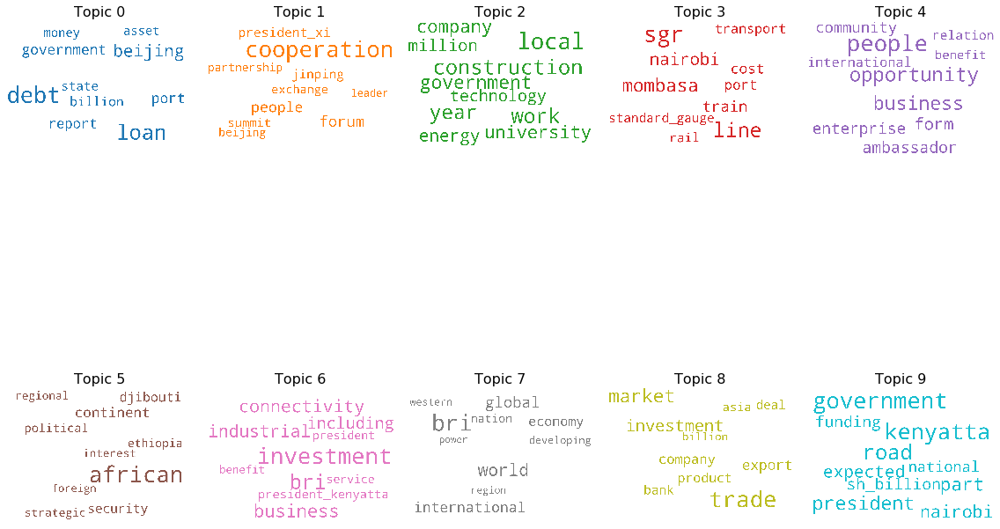

In [222]:
# 1. Wordcloud of Top N words in each topic
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

stopwords = set(STOPWORDS)

cloud = WordCloud(stopwords=stopwords, background_color='white', width=2500, height=1800, max_words=10, colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i], prefer_horizontal=1.0)

topics = local_best_lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 5, figsize=(16,16), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

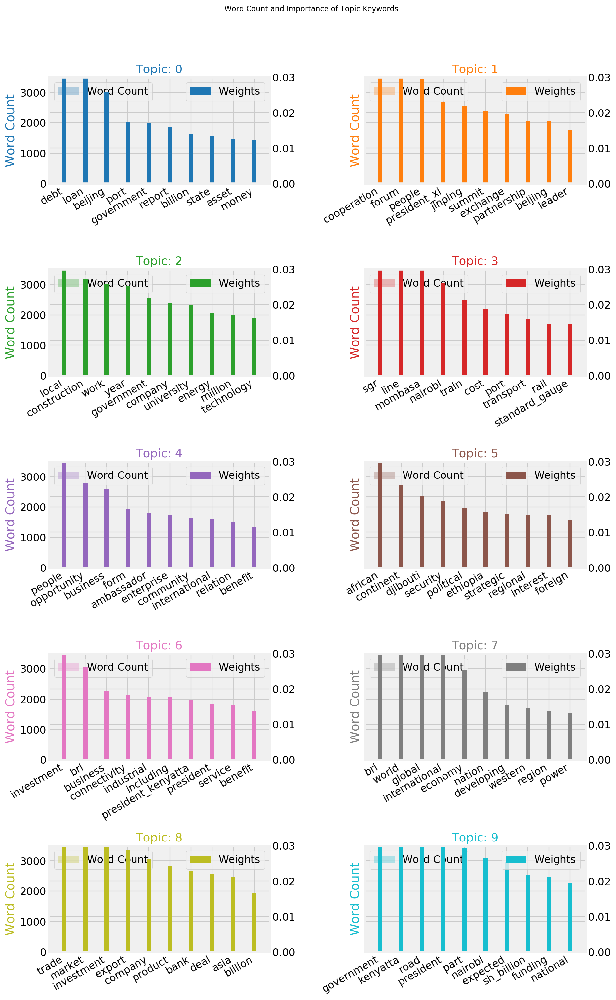

In [223]:
for data in norm_local_corpus:
    data_ready = [nltk.word_tokenize(data)]
    for w_list in data_ready:
        w = w_list
topics = local_best_lda_model.show_topics(formatted=False)
data_flat = w
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 2, figsize=(12, 18), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=10, y=1.05)    
plt.show()

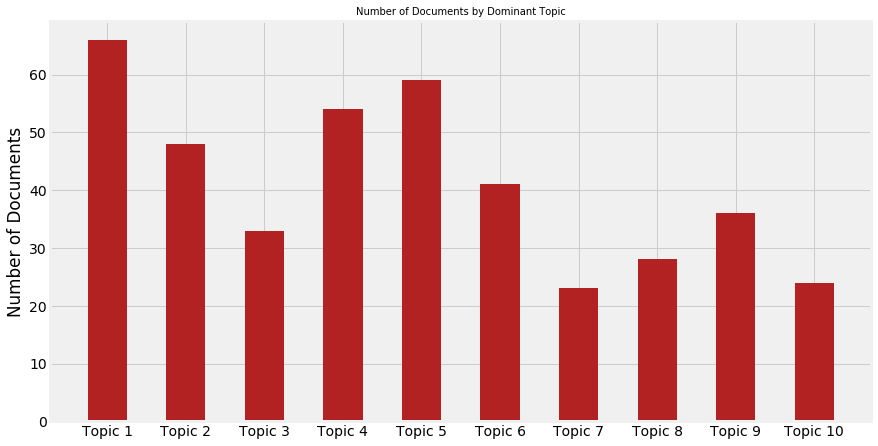

In [224]:
# Plot
plt.figure(figsize=(12,6))
x = ['Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10']

# Topic Distribution by Dominant Topics
plt.bar(x, height='Doc Count', data=local_topic_stats_df, width=.5, color='firebrick')


plt.title('Number of Documents by Dominant Topic', fontdict=dict(size=10))

plt.ylabel('Number of Documents')
plt.tight_layout(pad=0)
plt.show()

plt.show()

### Visualizing Topic Models For Local News Media

In [121]:
local_vis = pyLDAvis.gensim.prepare(local_lda_model, local_bow_corpus, local_dictionary)
pyLDAvis.display(local_vis)

## Topic Modeling for Other news Articles

In [122]:
#corpus bigram for local news articles
other_tokenize_corpus = [nltk.word_tokenize(token) for token in norm_other_corpus]
other_bigram = gensim.models.Phrases(other_tokenize_corpus, min_count=20, threshold=20, delimiter=b'_')

other_bigram_model = gensim.models.phrases.Phraser(other_bigram)

other_norm_corpus_bigram = [other_bigram_model[token] for token in other_tokenize_corpus]

In [123]:
#build dictionary for the local news articles
other_dictionary = Dictionary(other_norm_corpus_bigram)
print((list(other_dictionary.items())))

[(0, 'activity'), (1, 'adopted'), (2, 'affect'), (3, 'africa'), (4, 'african'), (5, 'agreement'), (6, 'aim'), (7, 'airport'), (8, 'ambitious'), (9, 'approach'), (10, 'appropriate'), (11, 'approved'), (12, 'asian'), (13, 'ask'), (14, 'aspect'), (15, 'associated'), (16, 'attractive'), (17, 'avoid'), (18, 'b'), (19, 'bank'), (20, 'benefit'), (21, 'best'), (22, 'better'), (23, 'beyond'), (24, 'bilaterally'), (25, 'bit'), (26, 'blueprint'), (27, 'border'), (28, 'borrowing'), (29, 'break'), (30, 'bri'), (31, 'building'), (32, 'built'), (33, 'cambodia'), (34, 'capacity'), (35, 'capital'), (36, 'challenge'), (37, 'china'), (38, 'chinese'), (39, 'city'), (40, 'clear'), (41, 'clearly'), (42, 'come'), (43, 'comfortable'), (44, 'conceived'), (45, 'concessional'), (46, 'condition'), (47, 'confident'), (48, 'congestion'), (49, 'connect'), (50, 'connecting'), (51, 'connects'), (52, 'conservative'), (53, 'constraint'), (54, 'contribute'), (55, 'country'), (56, 'creating'), (57, 'crucial'), (58, 'dam')

In [125]:
# Transforming corpus into bag of words vectors
other_bow_corpus = [other_dictionary.doc2bow(doc) for doc in other_norm_corpus_bigram]
print(other_bow_corpus[1][:50])

[(1, 2), (2, 2), (3, 8), (6, 1), (7, 1), (8, 7), (9, 2), (11, 1), (12, 1), (13, 2), (15, 2), (16, 2), (18, 1), (19, 1), (24, 1), (26, 1), (27, 1), (29, 2), (30, 1), (31, 4), (32, 1), (34, 1), (35, 1), (36, 1), (38, 1), (40, 4), (41, 1), (43, 2), (44, 2), (45, 6), (46, 1), (47, 2), (48, 1), (49, 1), (50, 1), (51, 1), (52, 3), (53, 1), (54, 1), (55, 4), (56, 2), (57, 2), (58, 2), (59, 3), (60, 3), (61, 1), (62, 2), (63, 1), (64, 6), (65, 1)]


In [225]:
# viewing actual terms and their counts
print([(other_dictionary[idx] , freq) for idx, freq in other_bow_corpus[3][:50]])

[('benefit', 2), ('despite', 2), ('economy', 1), ('job', 2), ('long', 1), ('major', 1), ('make', 1), ('national', 2), ('need', 2), ('opportunity', 2), ('part', 2), ('partner', 1), ('people', 1), ('power', 4), ('time', 1), ('way', 1), ('across', 2), ('company', 1), ('concern', 1), ('first', 2), ('funded', 1), ('future', 2), ('influence', 4), ('loan', 1), ('nairobi', 1), ('nation', 1), ('number', 1), ('president_xi', 1), ('second', 1), ('south', 2), ('without', 1), ('according', 1), ('another', 1), ('launched', 1), ('since', 3), ('around', 2), ('become', 1), ('build', 1), ('business', 2), ('case', 1), ('continent', 5), ('important', 1), ('political', 1), ('see', 1)]


In [226]:
#Topic Model
other_lda_model = gensim.models.LdaModel(corpus=other_bow_corpus, id2word=other_dictionary, num_topics=10, chunksize=1740, alpha='auto', 
                                   eta='auto', random_state=42, iterations=500, passes=20, eval_every=None)

In [227]:
#viewing the topics
for topic_id, topic in other_lda_model.print_topics(num_topics=10, num_words=10):
    pprint('Topic #'+str(topic_id+1)+':')
    pprint(topic)
    print()

'Topic #1:'
('0.100*"million" + 0.097*"nairobi" + 0.062*"mombasa" + 0.054*"use" + '
 '0.046*"good" + 0.044*"last" + 0.042*"transport" + 0.038*"built" + '
 '0.038*"opened" + 0.032*"business"')

'Topic #2:'
('0.067*"debt" + 0.049*"bri" + 0.044*"loan" + 0.028*"power" + 0.020*"leader" + '
 '0.016*"time" + 0.016*"ethiopia" + 0.016*"kenyatta" + 0.015*"nation" + '
 '0.015*"concern"')

'Topic #3:'
('0.064*"sgr" + 0.059*"nairobi" + 0.045*"mombasa" + 0.045*"like" + '
 '0.044*"continent" + 0.043*"standard_gauge" + 0.038*"djibouti" + '
 '0.036*"cooperation" + 0.034*"kenyatta" + 0.032*"across"')

'Topic #4:'
('0.130*"maritime" + 0.087*"military" + 0.053*"djibouti" + 0.034*"sea" + '
 '0.028*"state" + 0.026*"region" + 0.024*"building" + 0.023*"strategic" + '
 '0.021*"major" + 0.021*"national"')

'Topic #5:'
('0.055*"east" + 0.048*"network" + 0.042*"regional" + 0.031*"maritime" + '
 '0.028*"key" + 0.027*"djibouti" + 0.026*"along" + 0.026*"ethiopia" + '
 '0.025*"silk_road" + 0.022*"europe"')

'Topic #6

In [228]:
#overall mean coherence score
other_topic_coherences = other_lda_model.top_topics(other_bow_corpus, topn=10)
other_avg_coherence_score = np.mean([item[1] for item in other_topic_coherences])
print('Avg. Coherence Score:', other_avg_coherence_score)

Avg. Coherence Score: -0.628071023588715


In [229]:
# Filter out words that occur less than 20 documents, or more than 50% of the documents.
other_dictionary.filter_extremes(no_below=20, no_above=0.6)

print('Total Vocabulary Size:', len(other_dictionary))

Total Vocabulary Size: 121


In [230]:
# total papers in the corpus
print('Total number of papers:', len(other_bow_corpus))

Total number of papers: 59


In [231]:
other_topics_with_wts = [item[0] for item in other_topic_coherences]
print('LDA Topics with Weights')
print('='*50)
for idx, topic in enumerate(other_topics_with_wts):
    pprint('Topic #'+str(idx+1)+':')
    pprint([(term, round(wt, 3)) for wt, term in topic])
    print()

LDA Topics with Weights
'Topic #1:'
[('east', 0.055),
 ('network', 0.048),
 ('regional', 0.042),
 ('maritime', 0.031),
 ('key', 0.028),
 ('djibouti', 0.027),
 ('along', 0.026),
 ('ethiopia', 0.026),
 ('silk_road', 0.025),
 ('europe', 0.022)]

'Topic #2:'
[('nairobi', 0.079),
 ('mombasa', 0.075),
 ('sgr', 0.052),
 ('loan', 0.051),
 ('nation', 0.049),
 ('local', 0.03),
 ('take', 0.025),
 ('debt', 0.024),
 ('like', 0.022),
 ('built', 0.02)]

'Topic #3:'
[('power', 0.031),
 ('south', 0.026),
 ('continent', 0.025),
 ('cooperation', 0.025),
 ('company', 0.022),
 ('leader', 0.021),
 ('part', 0.02),
 ('first', 0.02),
 ('bank', 0.02),
 ('national', 0.02)]

'Topic #4:'
[('agreement', 0.073),
 ('state', 0.051),
 ('debt', 0.043),
 ('people', 0.041),
 ('take', 0.034),
 ('much', 0.034),
 ('sgr', 0.034),
 ('loan', 0.034),
 ('like', 0.028),
 ('kenyatta', 0.027)]

'Topic #5:'
[('maritime', 0.13),
 ('military', 0.087),
 ('djibouti', 0.053),
 ('sea', 0.034),
 ('state', 0.028),
 ('region', 0.026),
 ('buil

In [232]:
print('LDA Topics without Weights')
print('='*50)
for idx, topic in enumerate(other_topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([term for wt, term in topic])
    print()

LDA Topics without Weights
Topic #1:
['east', 'network', 'regional', 'maritime', 'key', 'djibouti', 'along', 'ethiopia', 'silk_road', 'europe']

Topic #2:
['nairobi', 'mombasa', 'sgr', 'loan', 'nation', 'local', 'take', 'debt', 'like', 'built']

Topic #3:
['power', 'south', 'continent', 'cooperation', 'company', 'leader', 'part', 'first', 'bank', 'national']

Topic #4:
['agreement', 'state', 'debt', 'people', 'take', 'much', 'sgr', 'loan', 'like', 'kenyatta']

Topic #5:
['maritime', 'military', 'djibouti', 'sea', 'state', 'region', 'building', 'strategic', 'major', 'national']

Topic #6:
['debt', 'bri', 'loan', 'power', 'leader', 'time', 'ethiopia', 'kenyatta', 'nation', 'concern']

Topic #7:
['sgr', 'nairobi', 'mombasa', 'like', 'continent', 'standard_gauge', 'djibouti', 'cooperation', 'kenyatta', 'across']

Topic #8:
['bri', 'partner', 'cooperation', 'economy', 'nation', 'people', 'growth', 'global', 'help', 'see']

Topic #9:
['million', 'nairobi', 'mombasa', 'use', 'good', 'last', '

In [233]:
other_cv_coherence_lda_model = CoherenceModel(model=other_lda_model, texts=other_norm_corpus_bigram, corpus=other_bow_corpus, dictionary=other_dictionary, 
                                        topn=10)
other_avg_coherence_cv = other_cv_coherence_lda_model.get_coherence()

print('Avg. Coherence Score (Cv):', other_avg_coherence_cv)

Avg. Coherence Score (Cv): 0.46461698984166777


In [234]:
#LDA model with MALLET
os.environ.update({'MALLET_HOME':r'C:\Users\Gilbert\Desktop\mallet-2.0.8'})
MALLET_PATH = r"C:\Users\Gilbert\Desktop\mallet-2.0.8\bin\mallet"
other_lda_mallet = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=other_bow_corpus, num_topics=10, id2word=other_dictionary,
                                             iterations=500, workers=16)

In [235]:
topics = [[(term, round(wt, 3))
for term, wt in other_lda_mallet.show_topic(n, topn=10)]
for n in range(0, 10)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['partner', 'including', 'million', 'construction', 'growth', 'service', 'financial', 'case', 'building', 'policy']

Topic #2:
['local', 'europe', 'plan', 'largest', 'economy', 'high', 'region', 'potential', 'market', 'land']

Topic #3:
['maritime', 'company', 'bank', 'sea', 'link', 'area', 'fund', 'interest', 'state', 'due']

Topic #4:
['djibouti', 'east', 'military', 'network', 'regional', 'key', 'benefit', 'major', 'region', 'opportunity']

Topic #5:
['debt', 'bri', 'loan', 'time', 'future', 'risk', 'concern', 'public', 'president_xi', 'including']

Topic #6:
['nation', 'state', 'agreement', 'president', 'term', 'recent', 'long', 'job', 'people', 'economy']

Topic #7:
['continent', 'built', 'road', 'kenyatta', 'ethiopia', 'business', 'funding', 'president_uhuru', 'transport', 'opened']

Topic #8:
['nairobi', 'mombasa', 'sgr', 'good', 'city', 'standard_gauge', 'loan', 'people', 'funded', 'major']

Topic #9:
['cooperation', 'part', 'south', 'national', 'support', 'silk_road'

In [236]:
#evaluate the model
other_cv_coherence_model_lda_mallet = CoherenceModel(model=other_lda_mallet, texts=other_norm_corpus_bigram, corpus=other_bow_corpus, 
                                              dictionary=other_dictionary, topn=10)

In [237]:
other_avg_coherence_cv = other_cv_coherence_model_lda_mallet.get_coherence()
print('Avg. Coherence Score (Cv):', other_avg_coherence_cv)

Avg. Coherence Score (Cv): 0.42861454597969795


### LDA Tuning: Find the optimal number of topic in Other News Articles

In [238]:
def other_topic_model_coherence_generator(corpus, texts, dictionary, start_topic_count=2, end_topic_count=10, step=1, cpus=1):
    models = []
    coherence_scores = []
    for topic_num in tqdm(range(start_topic_count, end_topic_count+1, step)):
        lda_mallet_model = gensim.models.wrappers.LdaMallet(mallet_path=MALLET_PATH, corpus=corpus, num_topics=topic_num,
                                                            id2word=dictionary)
        cv_coherence_mallet = CoherenceModel(model=lda_mallet_model, texts=texts, corpus=corpus, dictionary=dictionary, topn=10)
        
        coherence_score = cv_coherence_mallet.get_coherence()
        coherence_scores.append(coherence_score)
        models.append(lda_mallet_model)
    return models, coherence_scores

In [239]:
other_lda_models, other_coherence_scores = other_topic_model_coherence_generator(other_bow_corpus, other_norm_corpus_bigram, other_dictionary, 
                                                                                 start_topic_count=2, end_topic_count=30)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [18:16<00:00, 37.80s/it]


In [240]:
other_coherence_df = pd.DataFrame({'Number of Topics': range(2,31,1), 'Coherence Scores': np.round(other_coherence_scores, 4)})

other_coherence_df.sort_values(['Coherence Scores'], ascending=False).head(10)

,Number of Topics,Coherence Scores
4,6,0.4815
6,8,0.4714
5,7,0.4684
7,9,0.4490
9,11,0.4439
8,10,0.4384
3,5,0.4352
11,13,0.4299
12,14,0.4179
2,4,0.4171


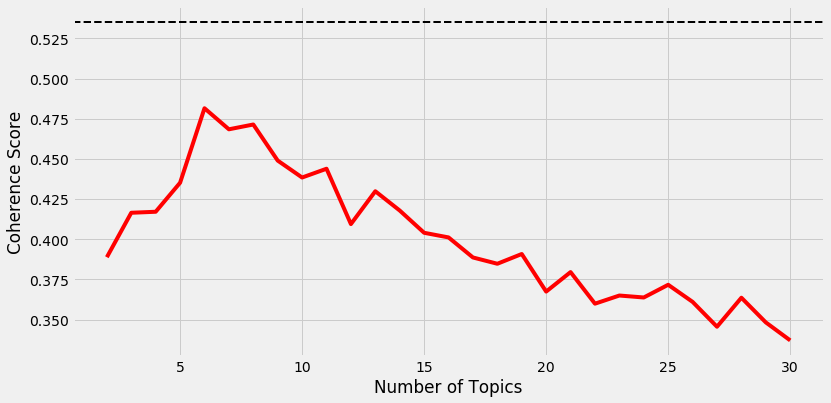

In [241]:
plt.style.use('fivethirtyeight')
x_ax = range(2, 31, 1)
y_ax = other_coherence_scores
plt.figure(figsize=(12, 6))
plt.plot(x_ax, y_ax, c='r')
plt.axhline(y=0.535, c='k', linestyle='--', linewidth=2)
plt.rcParams['figure.facecolor'] = 'white'
xl = plt.xlabel('Number of Topics')
yl = plt.ylabel('Coherence Score')

In [242]:
other_best_model_idx = other_coherence_df[other_coherence_df["Number of Topics"] == 10].index[0]
other_best_lda_model = other_lda_models[other_best_model_idx]
other_best_lda_model.num_topics

10

In [243]:
topics = [[(term, round(wt, 3))
for term, wt in other_best_lda_model.show_topic(n, topn=10)]
for n in range(0, other_best_lda_model.num_topics)]
for idx, topic in enumerate(topics):
    print('Topic #'+str(idx+1)+':')
    print([term for term, wt in topic])
    print()

Topic #1:
['djibouti', 'east', 'maritime', 'ethiopia', 'network', 'sea', 'silk_road', 'link', 'regional', 'important']

Topic #2:
['sgr', 'people', 'service', 'agreement', 'benefit', 'state', 'signed', 'growth', 'building', 'case']

Topic #3:
['debt', 'loan', 'continent', 'number', 'risk', 'financial', 'concern', 'public', 'case', 'including']

Topic #4:
['company', 'bank', 'construction', 'partner', 'interest', 'area', 'key', 'funding', 'market', 'silk_road']

Topic #5:
['bri', 'europe', 'plan', 'term', 'future', 'fund', 'land', 'largest', 'potential', 'high']

Topic #6:
['nairobi', 'mombasa', 'kenyatta', 'city', 'standard_gauge', 'time', 'president', 'launched', 'president_uhuru', 'move']

Topic #7:
['military', 'cooperation', 'part', 'south', 'national', 'strategic', 'support', 'opportunity', 'major', 'concern']

Topic #8:
['global', 'nation', 'local', 'region', 'million', 'state', 'economy', 'growing', 'long', 'recent']

Topic #9:
['power', 'leader', 'policy', 'forum', 'influence',

In [244]:
other_topics_df = pd.DataFrame([[term for term, wt in topic] for topic in topics], columns = ['Term'+str(i) for i in range(1, 11)],
                            index=['Topic '+str(t) for t in range(1, other_best_lda_model.num_topics+1)]).T
other_topics_df

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
Term1,djibouti,sgr,debt,company,bri,nairobi,military,global,power,built
Term2,east,people,loan,bank,europe,mombasa,cooperation,nation,leader,road
Term3,maritime,service,continent,construction,plan,kenyatta,part,local,policy,good
Term4,ethiopia,agreement,number,partner,term,city,south,region,forum,business
Term5,network,benefit,risk,interest,future,standard_gauge,national,million,influence,transport
Term6,sea,state,financial,area,fund,time,strategic,state,political,make
Term7,silk_road,signed,concern,key,land,president,support,economy,funded,including
Term8,link,growth,public,funding,largest,launched,opportunity,growing,build,job
Term9,regional,building,case,market,potential,president_uhuru,major,long,president_xi,opened
Term10,important,case,including,silk_road,high,move,concern,recent,official,economy


In [245]:
pd.set_option('display.max_colwidth', -1) 
other_topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], 
                         index=['Topic ' + str(t) for t in range(1, other_best_lda_model.num_topics+1)])
other_topics_df

,Terms per Topic
Topic 1,"djibouti, east, maritime, ethiopia, network, sea, silk_road, link, regional, important"
Topic 2,"sgr, people, service, agreement, benefit, state, signed, growth, building, case"
Topic 3,"debt, loan, continent, number, risk, financial, concern, public, case, including"
Topic 4,"company, bank, construction, partner, interest, area, key, funding, market, silk_road"
Topic 5,"bri, europe, plan, term, future, fund, land, largest, potential, high"
Topic 6,"nairobi, mombasa, kenyatta, city, standard_gauge, time, president, launched, president_uhuru, move"
Topic 7,"military, cooperation, part, south, national, strategic, support, opportunity, major, concern"
Topic 8,"global, nation, local, region, million, state, economy, growing, long, recent"
Topic 9,"power, leader, policy, forum, influence, political, funded, build, president_xi, official"
Topic 10,"built, road, good, business, transport, make, including, job, opened, economy"


### Interpreting Topic Model Results for Other News Articles

In [246]:
#Distribution of topics in each document
other_tm_results = other_best_lda_model[other_bow_corpus]
other_tm_results

[[(0, 0.06772486772486774),
  (1, 0.09206349206349208),
  (2, 0.06560846560846562),
  (3, 0.08253968253968255),
  (4, 0.17460317460317462),
  (5, 0.06031746031746033),
  (6, 0.13333333333333336),
  (7, 0.08677248677248679),
  (8, 0.05502645502645504),
  (9, 0.18201058201058204)],
 [(0, 0.03982016698779704),
  (1, 0.07193320488118175),
  (2, 0.18882466281310212),
  (3, 0.08477842003853564),
  (4, 0.16955684007707128),
  (5, 0.14129736673089274),
  (6, 0.057803468208092484),
  (7, 0.07000642260757868),
  (8, 0.11496467565831728),
  (9, 0.06101477199743096)],
 [(0, 0.07228915662650603),
  (1, 0.1137884872824632),
  (2, 0.06024096385542169),
  (3, 0.11914323962516735),
  (4, 0.08433734939759037),
  (5, 0.19143239625167338),
  (6, 0.07228915662650603),
  (7, 0.10441767068273093),
  (8, 0.08433734939759037),
  (9, 0.09772423025435074)],
 [(0, 0.058361391694725026),
  (1, 0.08529741863075196),
  (2, 0.13019079685746351),
  (3, 0.06958473625140292),
  (4, 0.07407407407407407),
  (5, 0.07856341

In [247]:
#dominant topic in each document
other_corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in other_tm_results]
other_corpus_topics[:5]

[(9, 0.18201058201058204),
 (2, 0.18882466281310212),
 (5, 0.19143239625167338),
 (8, 0.1739618406285073),
 (0, 0.17884322678843226)]

In [248]:
other_corpus_topic_df = pd.DataFrame()
other_corpus_topic_df['Document'] = range(0, len(norm_other_corpus))
other_corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in other_corpus_topics]
other_corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in other_corpus_topics]
other_corpus_topic_df['Topic Desc'] = [other_topics_df.iloc[t[0]]['Terms per Topic'] for t in other_corpus_topics]
other_corpus_topic_df['Article'] = norm_other_corpus

In [249]:
pd.set_option('display.max_colwidth', 200)
other_topic_stats_df = other_corpus_topic_df.groupby('Dominant Topic').agg({'Dominant Topic': {'Doc Count': np.size, '% Total Docs': np.size }})

other_topic_stats_df = other_topic_stats_df['Dominant Topic'].reset_index()
other_topic_stats_df['% Total Docs'] = other_topic_stats_df['% Total Docs'].apply(lambda row: round((row*100) / len(norm_other_corpus), 2))
other_topic_stats_df['Topic Desc'] = [other_topics_df.iloc[t]['Terms per Topic'] for t in range(len(other_topic_stats_df))]
other_topic_stats_df

,Dominant Topic,Doc Count,% Total Docs,Topic Desc
0,1,7,11.86,"djibouti, east, maritime, ethiopia, network, sea, silk_road, link, regional, important"
1,2,4,6.78,"sgr, people, service, agreement, benefit, state, signed, growth, building, case"
2,3,12,20.34,"debt, loan, continent, number, risk, financial, concern, public, case, including"
3,4,2,3.39,"company, bank, construction, partner, interest, area, key, funding, market, silk_road"
4,5,4,6.78,"bri, europe, plan, term, future, fund, land, largest, potential, high"
5,6,11,18.64,"nairobi, mombasa, kenyatta, city, standard_gauge, time, president, launched, president_uhuru, move"
6,7,3,5.08,"military, cooperation, part, south, national, strategic, support, opportunity, major, concern"
7,8,5,8.47,"global, nation, local, region, million, state, economy, growing, long, recent"
8,9,7,11.86,"power, leader, policy, forum, influence, political, funded, build, president_xi, official"
9,10,4,6.78,"built, road, good, business, transport, make, including, job, opened, economy"


In [250]:
pd.set_option('display.max_colwidth', 80)
(other_corpus_topic_df[other_corpus_topic_df['Document'].isin([681, 9, 392, 1622, 17, 906, 996, 503, 13, 733])])

,Document,Dominant Topic,Contribution %,Topic Desc,Article
9,9,9,15.93,"power, leader, policy, forum, influence, political, funded, build, president...",kenya launched freight operation december extension multibillion dollar chin...
13,13,6,20.04,"nairobi, mombasa, kenyatta, city, standard_gauge, time, president, launched,...",kenya chinese built railway boon business billion line sliced hour journey p...
17,17,3,15.15,"debt, loan, continent, number, risk, financial, concern, public, case, inclu...",ruchita beri current belt road initiative bri forum meeting held beijing put...


In [251]:
other_corpus_topic_df.groupby('Dominant Topic').apply(lambda topic_set:( topic_set.sort_values(by=['Contribution %'],ascending=False).iloc[0]))

,Document,Dominant Topic,Contribution %,Topic Desc,Article
Dominant Topic,,,,,
1,51,1,32.41,"djibouti, east, maritime, ethiopia, network, sea, silk_road, link, regional,...",october chinese communist party enshrined xi jinpings belt road initiative o...
2,55,2,28.31,"sgr, people, service, agreement, benefit, state, signed, growth, building, case",bravely president uhuru kenyatta supported friend raila odinga civil servant...
3,38,3,25.90,"debt, loan, continent, number, risk, financial, concern, public, case, inclu...",six year since chinese president xi jinping launched silk road infrastructur...
4,49,4,27.45,"company, bank, construction, partner, interest, area, key, funding, market, ...",c africa long important market china investment chinese company private stat...
5,25,5,28.47,"bri, europe, plan, term, future, fund, land, largest, potential, high",chinese authority dubbed belt road initiative project century spanning count...
6,46,6,22.07,"nairobi, mombasa, kenyatta, city, standard_gauge, time, president, launched,...",red neon announces nairobi terminus chinese financed standard gauge railway ...
7,5,7,27.44,"military, cooperation, part, south, national, strategic, support, opportunit...",january china growing military engagement africa aimed advancing beijing eco...
8,15,8,28.63,"global, nation, local, region, million, state, economy, growing, long, recent",six year since belt road initiative launched nation worldwide started workin...
9,6,9,31.84,"power, leader, policy, forum, influence, political, funded, build, president...",august china doubling soft power initiative africa part china grand strategy...


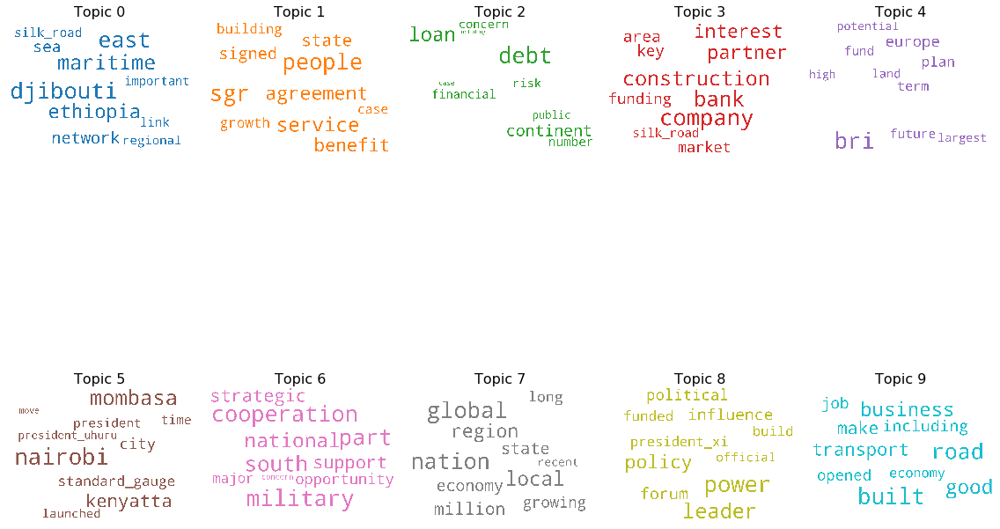

In [252]:
# 1. Wordcloud of Top N words in each topic
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

stopwords = set(STOPWORDS)

cloud = WordCloud(stopwords=stopwords, background_color='white', width=2500, height=1800, max_words=10, colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i], prefer_horizontal=1.0)

topics = other_best_lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 5, figsize=(16,16), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

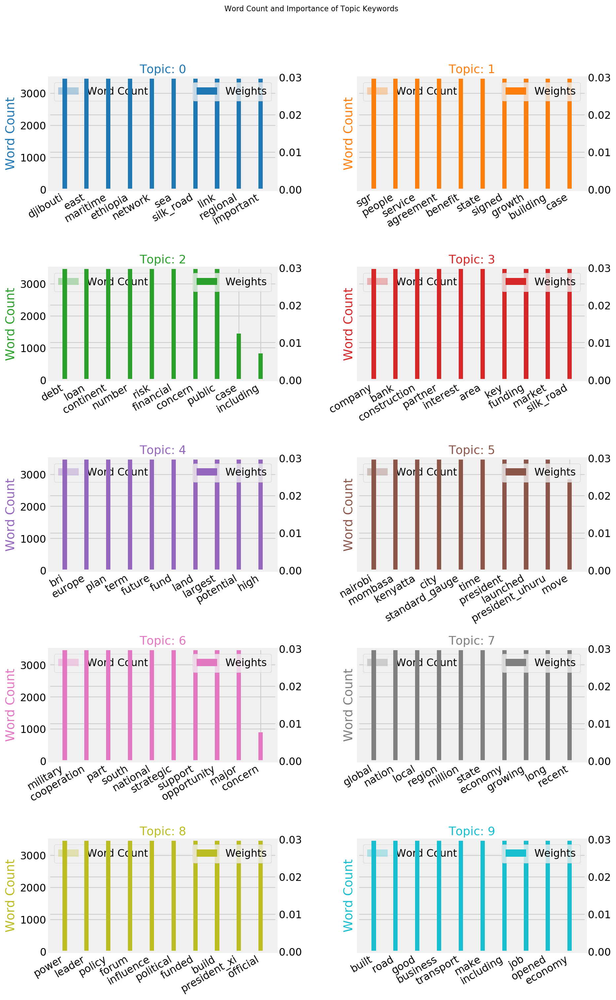

In [253]:
for data in norm_other_corpus:
    data_ready = [nltk.word_tokenize(data)]
    for w_list in data_ready:
        w = w_list
topics = other_best_lda_model.show_topics(formatted=False)
data_flat = w
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 2, figsize=(12, 18), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=10, y=1.05)    
plt.show()

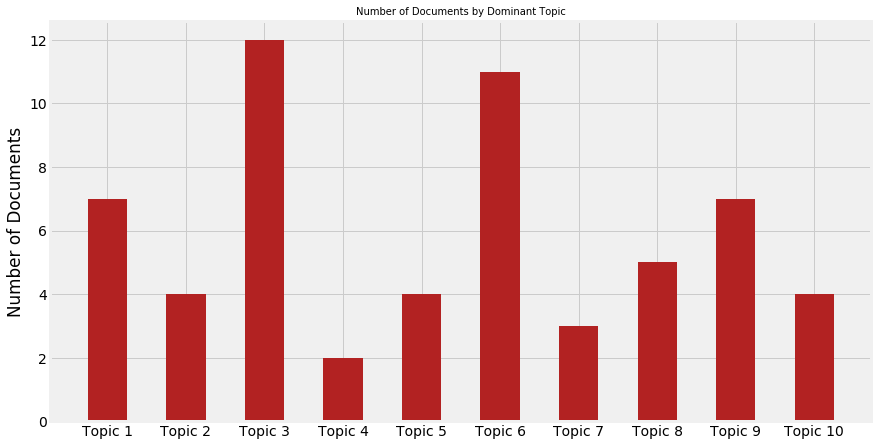

In [254]:
# Plot
plt.figure(figsize=(12,6))
x = ['Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10']

# Topic Distribution by Dominant Topics
plt.bar(x, height='Doc Count', data=other_topic_stats_df, width=.5, color='firebrick')


plt.title('Number of Documents by Dominant Topic', fontdict=dict(size=10))

plt.ylabel('Number of Documents')
plt.tight_layout(pad=0)
plt.show()

plt.show()

### Visualizing Topic Models for Other News Media

In [258]:
other_vis = pyLDAvis.gensim.prepare(other_lda_model, other_bow_corpus, other_dictionary)
pyLDAvis.display(other_vis)

# Chapter 5

## Sentiment Analysis For All News Articles

In [12]:
sentiment_summary = dict()

def sentiment_scores(norm_corpus): 
  
        # Create a SentimentIntensityAnalyzer object. 
    sid_obj = SentimentIntensityAnalyzer() 

        # polarity_scores method of SentimentIntensityAnalyzer 
        # oject gives a sentiment dictionary. 
        # which contains pos, neg, neu, and compound scores. 
    sentiment_dict = sid_obj.polarity_scores(norm_corpus) 

    print("Overall sentiment dictionary is : ", sentiment_dict) 
    print("sentence was rated as ", sentiment_dict['neg']*100, "% Negative") 
    print("sentence was rated as ", sentiment_dict['neu']*100, "% Neutral") 
    print("sentence was rated as ", sentiment_dict['pos']*100, "% Positive") 
  
    print("Sentence Overall Rated As", end = " ") 


        # decide sentiment as positive, negative and neutral 
    if sentiment_dict['compound'] >= 0.05 : 
        print("Positive")

    elif sentiment_dict['compound'] <= - 0.05 : 
        print("Negative")

    else : 
        print("Neutral")

In [62]:
os.chdir(r'C:\Users\Gilbert\Desktop\Bri Analysis')
def clean(corpus):
    sent = nltk.sent_tokenize(corpus)
    pattern = re.compile('[{}]'.format(p))
    st = [pattern.sub('', token) for token in sent]
    return st

for data in corpus:
    ne = clean(data)
    clean_data = ne
    for le in ne:
        sentiment_scores(le)

In [6]:
p = '!"#$%&\'()*+,-/:;<=>?@[\\]^_`{|}~'

In [53]:
import sys

orig_stdout = sys.stdout
f = open('out.txt', 'w')
sys.stdout = f

for i in range(2):
    print 'i = ', i

sys.stdout = orig_stdout
f.close()

In [48]:
sid = SentimentIntensityAnalyzer()
sentiment_summary = dict()
os.chdir(r'C:\Users\Gilbert\Desktop\Bri Analysis')
def clean(corpus):
    sent = nltk.sent_tokenize(corpus)
    pattern = re.compile('[{}]'.format(p))
    st = [pattern.sub('', token) for token in sent]
    return st

for data in corpus:
    ne = clean(data)
    clean_data = ne
    for le in ne:
        index = len(le)
        sentiment_score = sid.polarity_scores(le)
        if sentiment_score["compound"] == 0.0:
            sentiment_summary["neutral"] += 1
        elif sentiment_score["compound"] > 0.0:
            sentiment_summary["positive"] += 1
        else:
            sentiment_summary["negative"] += 1

df = pd.DataFrame({'Postive': positive, 'Neutral': neutral, 'Negative': negative, 'Compound': compound_score}, index=index)

KeyError: 'negative'

In [88]:
os.chdir(r'C:\Users\Gilbert\Desktop\Bri Analysis' )
with open("local_news_articles.csv", 'r', encoding='utf-8') as rf:
    local_data = csv.reader(rf)
    for l in local_data:
        pattern = re.compile('[{}]'.format(p))
        ll = pattern.sub('', l)
        print(ll)

TypeError: expected string or bytes-like object

In [92]:
c = '''
The downside is that Kenya was one of three African countries identified in a March 2018 report by the Washington-based Center for Global Development as at risk of debt distress as a result of its Belt and Road participation. The others were Egypt and Ethiopia. 
Kenya and landlocked Uganda had coordinated their plans for the new railway to reduce transport costs and the time it takes to move goods from the coast across each country and further into the eastern and central Africa hinterland. Yet with the realization that China may not release more funds.
Indeed, the initiative, Mr President, is not limited by geography. We see it as an opportunity to finally change Africa's position and become the new frontier for growth of the global economy, Kenyatta told Xi. "It reflects China's quest for shared prosperity." 

'''

In [99]:
cc = nltk.sent_tokenize(c)
for j in cc:
    pattern = re.compile('[{}]'.format(p))
    ll = pattern.sub('', j)

In [101]:
analyser = SentimentIntensityAnalyzer()


%time   #to calulate the time it takes the algorithm to compute a VADER score

i=0 #counter

compval1 = [ ]  #empty list to hold our computed 'compound' VADER scores


while (i<len(ll)):

    k = analyser.polarity_scores(ll)
    compval1.append(k['compound'])

    i = i+1
    
#converting sentiment values to numpy for easier usage

compval1 = np.array(compval1)

len(compval1)

Wall time: 0 ns


46

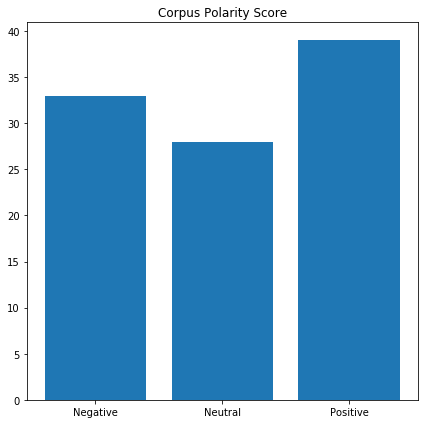

<Figure size 432x288 with 0 Axes>

In [17]:
plt.figure(figsize=(6,6), facecolor=None)
x = ['Negative', 'Neutral', 'Positive']
y = [33, 28, 39]
plt.bar(x, y)
plt.title("Corpus Polarity Score")

plt.tight_layout()
plt.show()
plt.savefig('polarity score.png')

In [19]:
print("Training Accuracy: 94.2%")

Training Accuracy: 94.2%
